In [2]:
pip install gymnasium

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 953.9/953.9 kB 8.0 MB/s eta 0:00:00


Now Initializing the Environment.....
The environment has been initialized, now the agent is at [0, 0]
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Now Rendering the Agent at [0, 0]


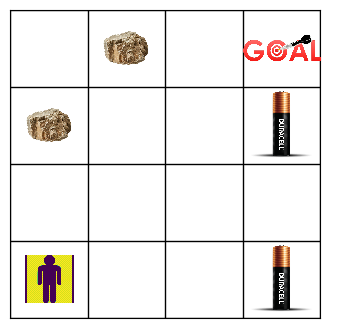

Step 0: Agent at [0, 0], action 3
For Step 1: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Now Rendering the Agent at [0, 0]


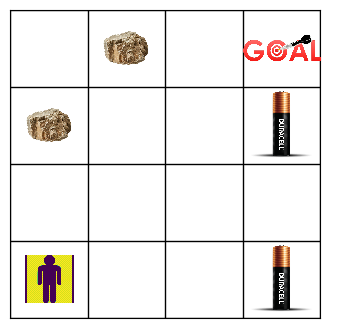

In the Test Loop - for Step: 1, The State is: 0, The Action taken is: 3, The Reward is: 0.0
Step 1: Agent at [0, 0], action 1
For Step 2: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Now Rendering the Agent at [0, 0]


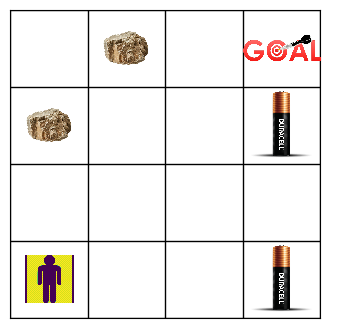

In the Test Loop - for Step: 2, The State is: 0, The Action taken is: 1, The Reward is: 0.0
Step 2: Agent at [0, 0], action 3
For Step 3: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Now Rendering the Agent at [0, 0]


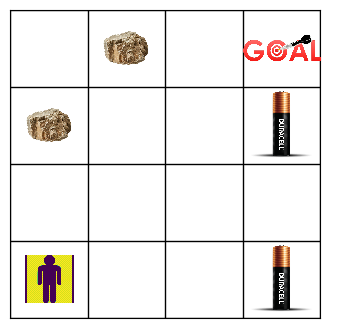

In the Test Loop - for Step: 3, The State is: 0, The Action taken is: 3, The Reward is: 0.0
Step 3: Agent at [0, 0], action 2
For Step 4: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Now Rendering the Agent at [0, 1]


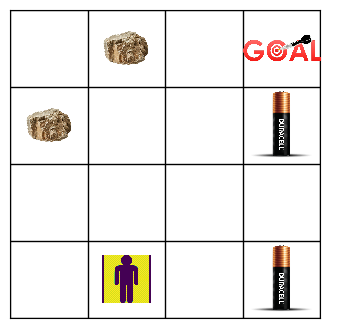

In the Test Loop - for Step: 4, The State is: 0, The Action taken is: 2, The Reward is: 0.0
Step 4: Agent at [0, 1], action 0
For Step 5: The Agent is now at [1, 1], the reward is: 0.0
The Current state is: 5
Now Rendering the Agent at [1, 1]


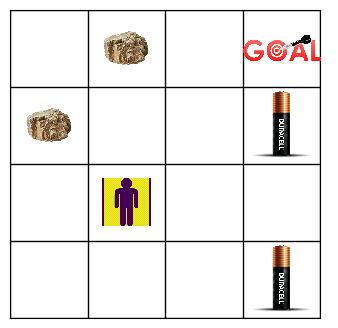

In the Test Loop - for Step: 5, The State is: 1, The Action taken is: 0, The Reward is: 0.0
Step 5: Agent at [1, 1], action 1
For Step 6: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Now Rendering the Agent at [0, 1]


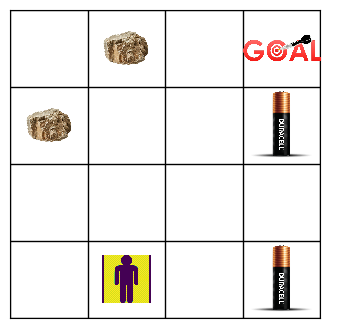

In the Test Loop - for Step: 6, The State is: 5, The Action taken is: 1, The Reward is: 0.0
Step 6: Agent at [0, 1], action 0
For Step 7: The Agent is now at [1, 1], the reward is: 0.0
The Current state is: 5
Now Rendering the Agent at [1, 1]


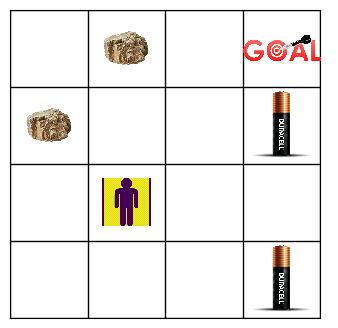

In the Test Loop - for Step: 7, The State is: 1, The Action taken is: 0, The Reward is: 0.0
Step 7: Agent at [1, 1], action 2
For Step 8: The Agent is now at [1, 2], the reward is: 0.0
The Current state is: 6
Now Rendering the Agent at [1, 2]


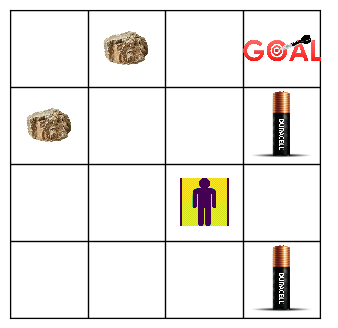

In the Test Loop - for Step: 8, The State is: 5, The Action taken is: 2, The Reward is: 0.0
Step 8: Agent at [1, 2], action 1
For Step 9: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Now Rendering the Agent at [0, 2]


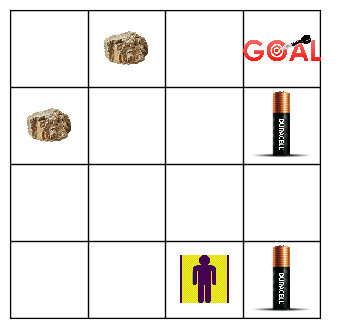

In the Test Loop - for Step: 9, The State is: 6, The Action taken is: 1, The Reward is: 0.0
Step 9: Agent at [0, 2], action 0
For Step 10: The Agent is now at [1, 2], the reward is: 0.0
The Current state is: 6
Now Rendering the Agent at [1, 2]


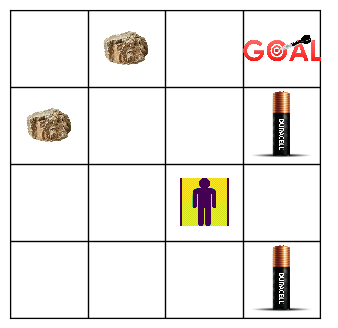

In the Test Loop - for Step: 10, The State is: 2, The Action taken is: 0, The Reward is: 0.0


In [ ]:
# Importing necessary libraries
import matplotlib.pyplot as plt  # Used for rendering the environment graphically
from matplotlib.offsetbox import OffsetImage, AnnotationBbox  # For placing images in the plot
import numpy as np  # For numerical operations
import gymnasium as gym  # Gymnasium library for creating environments
from gymnasium import spaces  # To define action and observation spaces

# Define the LawnmowerGridWorld (LGW) class, inheriting from gym.Env
class LGW(gym.Env):
    # Metadata for rendering modes
    md={'render.modes':['human']}

    # Constructor to initialize the environment
    def __init__(self):
        print("Now Initializing the Environment.....")  # Printing a statement for initialization
        self.gs=4  # Grid size is set to 4, creating a 4x4 grid
        self.ms=10  # Maximum steps in an episode set to 10
        self.cs=0  # Current step counter, starting at 0
        self.os=spaces.Discrete(self.gs ** 2)  # Observation space defined as discrete grid positions
        self.act_space = spaces.Discrete(4)  # Action space defined as four directions (up, down, right, left)
        self.ap=[0,0]  # Agent's starting position at the top-left corner
        self.gp=[3,3]  # Goal position set at the bottom-right corner

        # Defining reward positions
        self.prp=[(0,3),(2,3)]  # Positions for positive rewards
        self.nrp=[(2,0),(3,1)]  # Positions for negative rewards

        # Initializing reward values for each grid position
        self.rw=np.zeros((self.gs,self.gs))  # Start with a grid of zeros
        for p in self.prp:  # Loop through positive reward positions
            # Assigning a reward of 5, or 10 if it's the goal position
            self.rw[p]=5 if p!=self.gp else 10
        for p in self.nrp:  # Loop through negative reward positions
            # Assigning a penalty of -5, or 10 if it's the goal position
            self.rw[p]=-5 if p!=self.gp else 10

        print("The environment has been initialized, now the agent is at "+str(self.ap))  # Print statement confirming initialization

    # Reset function to start a new episode
    def rst(self):
        self.ap=[0,0]  # Resetting the agent's position
        self.cs=0  # Resetting the step counter
        print("The environment has been reset, now the agent is at "+str(self.ap))  # Print statement for reset confirmation
        return self._gs()  # Returning the initial state

    # Step function to apply an action and update the environment
    def stp(self,a):
        print("Step "+str(self.cs)+": Agent at "+str(self.ap)+", action "+str(a))  # Print statement showing action details
        # Moving the agent based on the action
        if a==0 and self.ap[0]<self.gs-1:  # Move down
            self.ap[0]+=1
        elif a==1 and self.ap[0]>0:  # Move up
            self.ap[0]-=1
        elif a==2 and self.ap[1]<self.gs-1:  # Move right
            self.ap[1]+=1
        elif a==3 and self.ap[1]>0:  # Move left
            self.ap[1]-=1

        # Clipping the position to ensure it stays within bounds
        self.ap=np.clip(self.ap,0,self.gs-1).tolist()
        self.cs+=1  # Incrementing the step counter

        # Checking for completion and reward conditions
        dn=False  # Flag for whether the episode is done
        rw=0  # Reward for this step
        if self.ap==self.gp:  # Check if agent reached the goal
            rw=10  # Goal reward
            dn=True  # Mark episode as done
        else:
            # Assign reward based on current position
            rw=self.rw[self.ap[0],self.ap[1]]
            # Check if maximum steps reached
            dn=self.cs>=self.ms

        print("For Step "+str(self.cs)+": The Agent is now at "+str(self.ap)+", the reward is: "+str(rw))  # Print the outcome of the step

        cs=self._gs()  # Get the current state

        return cs,rw,dn,{}  # Return the step information

    # Render function to visually depict the environment
    def rndr(self,mode='human'):
        print("Now Rendering the Agent at " + str(self.ap))  # Print statement for rendering
        # Set up the plot
        fig,ax=plt.subplots(figsize=(self.gs,self.gs))
        ax.set_xlim(-0.5,self.gs-0.5)
        ax.set_ylim(-0.5,self.gs-0.5)
        ax.set_xticks(np.arange(-0.5,self.gs,1))
        ax.set_yticks(np.arange(-0.5,self.gs,1))
        ax.grid(which='major',color='black',linestyle='-',linewidth=1)
        ax.tick_params(which='major',size=0,labelbottom=False,labelleft=False)  # Hide grid labels
        ax.invert_yaxis()  # Invert y-axis for correct orientation

        zf=0.075  # Zoom factor for images

        # Adding the agent's icon to the plot
        ai=plt.imread('agent.jpg')  # Load agent image
        ai_icon=AnnotationBbox(OffsetImage(ai, zoom=zf),
                                 (self.ap[1],self.gs-1-self.ap[0]),frameon=False)
        ax.add_artist(ai_icon)

        # Adding reward icons (positive and negative) to the plot
        for p in self.prp:  # Loop through positive rewards
            bi=plt.imread('battery.png')  # Load battery image
            bi_icon=AnnotationBbox(OffsetImage(bi,zoom=zf),
                                     (p[1],self.gs-1-p[0]), frameon=False)
            ax.add_artist(bi_icon)
        for p in self.nrp:  # Loop through negative rewards
            ri=plt.imread('rock.jpeg')  # Load rock image
            ri_icon=AnnotationBbox(OffsetImage(ri,zoom=zf),
                                     (p[1],self.gs-1-p[0]),frameon=False)
            ax.add_artist(ri_icon)

        # Adding the goal icon to the plot
        gi=plt.imread('goal.png')  # Load goal image
        gi_icon=AnnotationBbox(OffsetImage(gi,zoom=zf),
                                 (self.gp[1],self.gs-1-self.gp[0]),frameon=False)
        ax.add_artist(gi_icon)

        plt.show()  # Display the plot

    # Internal function to get the current state as a single integer
    def _gs(self):
        s=self.gs*self.ap[0]+self.ap[1]  # Calculating state value
        print("The Current state is: "+str(s))  # Print the current state
        return s  # Return the state

# Instantiate the LGW environment
env=LGW()
s=env.rst()  # Reset the environment to start
env.rndr()  # Render the initial state
dn=False  # Flag for episode completion

# Main loop to test the environment
while not dn:
    a=env.act_space.sample()  # Sample a random action
    ns,rw,dn,_=env.stp(a)  # Apply the action and get results
    env.rndr()  # Render the environment after the action
    print("In the Test Loop - for Step: "+str(env.cs)+", The State is: "+str(s)+", The Action taken is: "+str(a)+", The Reward is: "+str(rw))  # Print step information
    s=ns  # Update the state

Streaming output truncated to the last 5000 lines.
Step 4: Agent at [0, 0], action 0
For Step 5: The Agent is now at [1, 0], the reward is: 0.0
The Current state is: 4
Step 5: Agent at [1, 0], action 0
For Step 6: The Agent is now at [2, 0], the reward is: -5.0
The Current state is: 8
Step 6: Agent at [2, 0], action 2
For Step 7: The Agent is now at [2, 1], the reward is: 0.0
The Current state is: 9
Step 7: Agent at [2, 1], action 0
For Step 8: The Agent is now at [3, 1], the reward is: -5.0
The Current state is: 13
Step 8: Agent at [3, 1], action 2
For Step 9: The Agent is now at [3, 2], the reward is: 0.0
The Current state is: 14
Step 9: Agent at [3, 2], action 1
For Step 10: The Agent is now at [2, 2], the reward is: 0.0
The Current state is: 10
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 3
For Step 1: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 1: Agent at [0, 0], action 1
For Ste

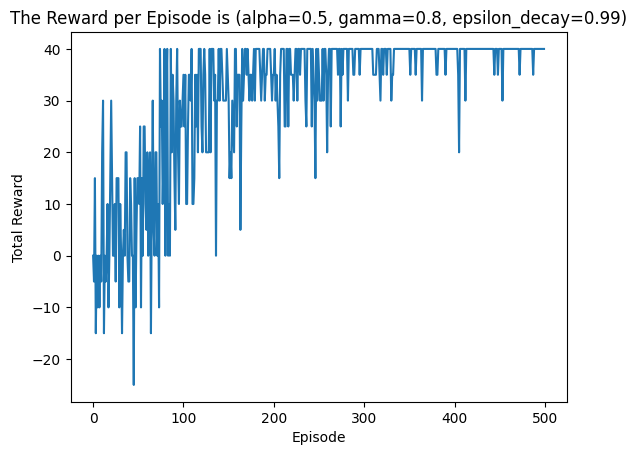

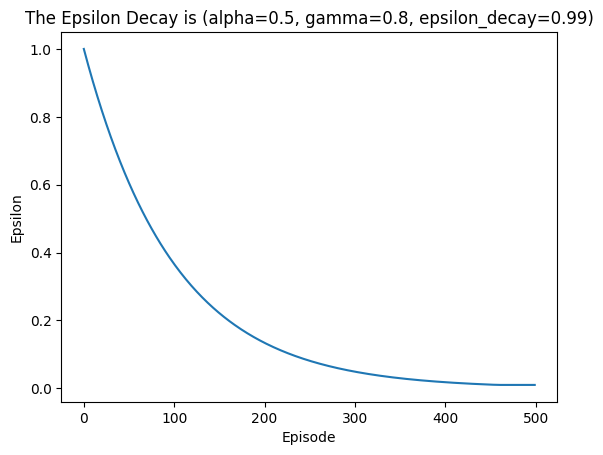

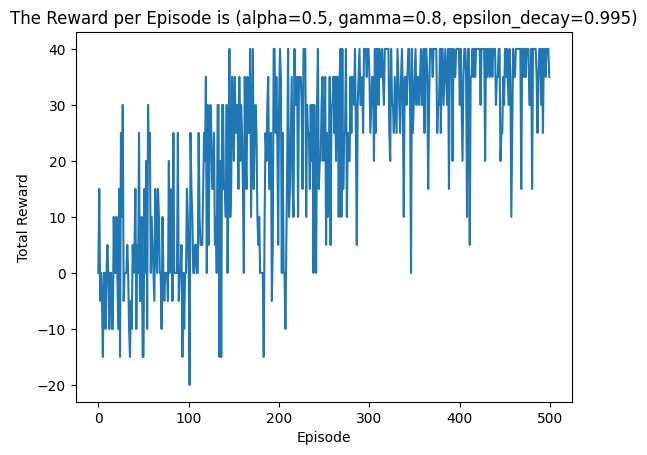

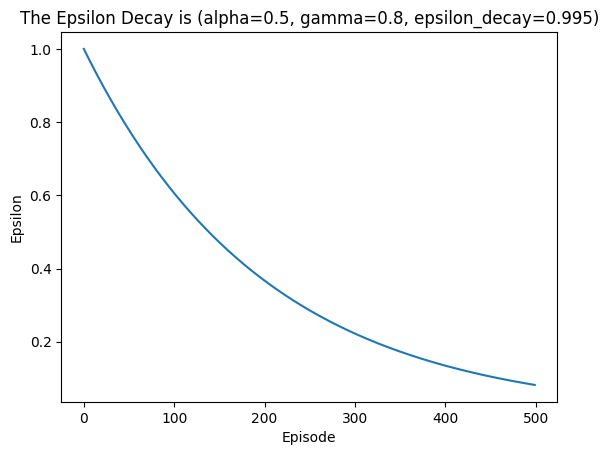

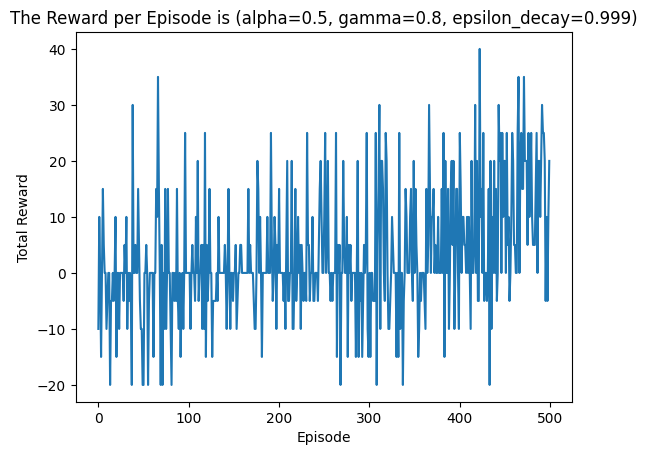

...

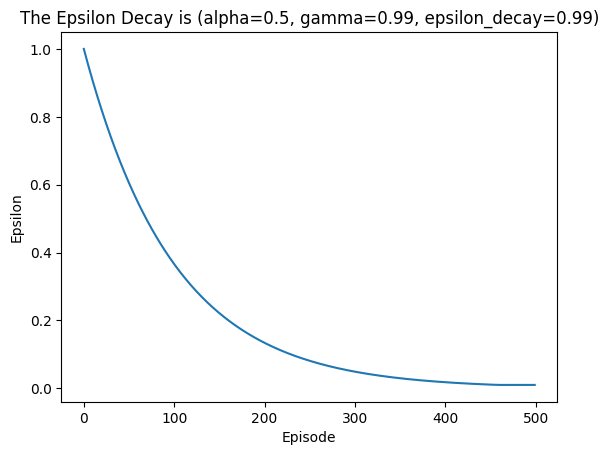

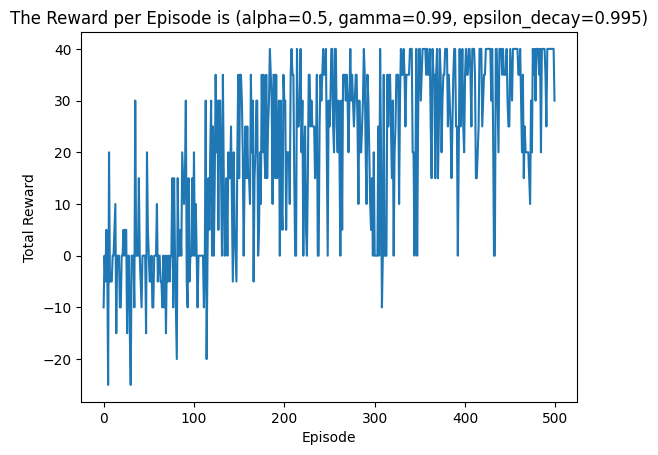

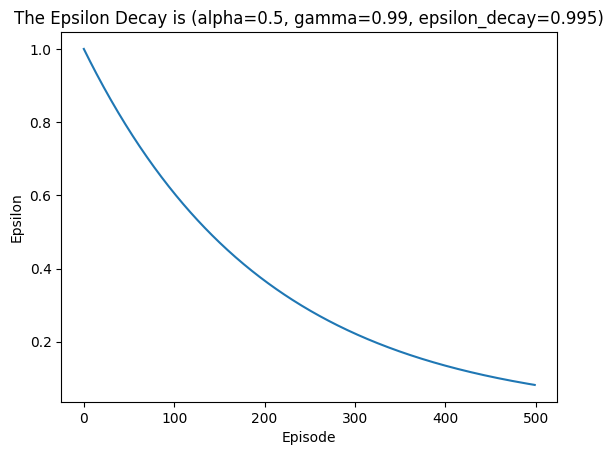

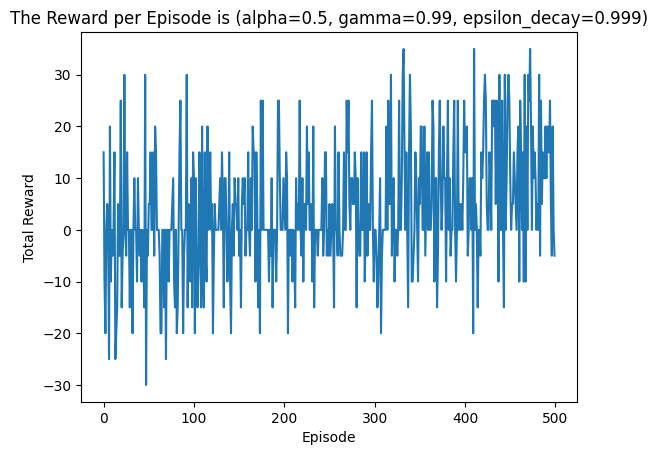

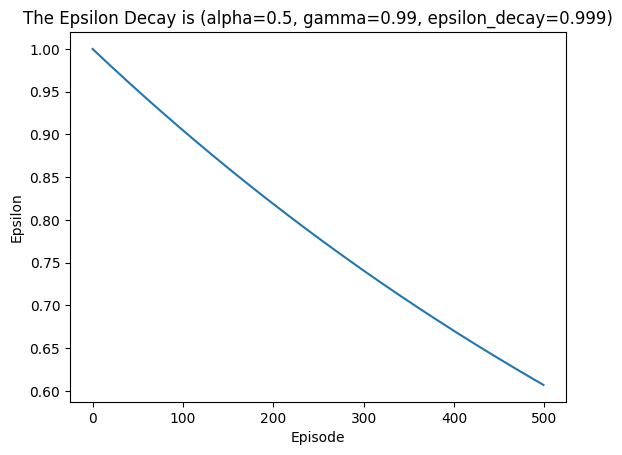

Chosen hyperparameters - alpha: 0.5, gamma: 0.8, epsilon_decay: 0.99
Initial Q-Table:
defaultdict(<function init_qt.<locals>.<lambda> at 0x7ba4382b0700>, {0: array([0, 0, 0, 0]), 1: array([0, 0, 0, 0]), 2: array([0, 0, 0, 0]), 3: array([0, 0, 0, 0]), 4: array([0, 0, 0, 0]), 5: array([0, 0, 0, 0]), 6: array([0, 0, 0, 0]), 7: array([0, 0, 0, 0]), 8: array([0, 0, 0, 0]), 9: array([0, 0, 0, 0]), 10: array([0, 0, 0, 0]), 11: array([0, 0, 0, 0]), 12: array([0, 0, 0, 0]), 13: array([0, 0, 0, 0]), 14: array([0, 0, 0, 0]), 15: array([0, 0, 0, 0])})
Trained Q-Table (alpha=0.5, gamma=0.8, epsilon_decay=0.99):
defaultdict(<function init_qt.<locals>.<lambda> at 0x7ba437fdb250>, {0: array([2, 3, 7, 3]), 1: array([ 4,  7, 11,  2]), 2: array([ 7, 11, 16,  3]), 3: array([11, 16, 15, 11]), 4: array([-5,  4,  2, -1]), 5: array([0, 6, 1, 0]), 6: array([ 1,  6, 11,  0]), 7: array([ 9, 16,  6,  6]), 8: array([ 0,  0,  0, -4]), 9: array([-4,  0,  0, -3]), 10: array([ 1,  2,  6, -1]), 11: array([9, 7, 6, 1]),

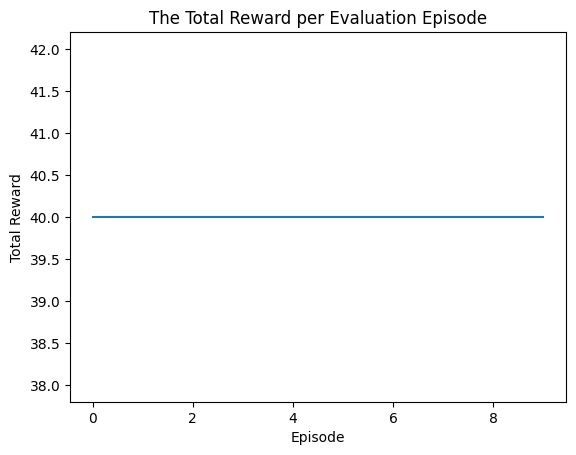

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import gymnasium as gym
from collections import defaultdict
from itertools import product

# I'm defining a function to initialize the Q-table.
def init_qt(ss,asp,iv=0):
    # I'm using a defaultdict to handle unseen states.
    # It'll return a zero array for actions if the state is new.
    Q=defaultdict(lambda: np.zeros(asp.n))
    # Now, I'm initializing the Q-values for all state-action pairs to a default value (initial_value).
    for s in range(ss.n):
        Q[s]=np.full(asp.n,iv)
    return Q

# Now, let's define the epsilon-greedy policy for action selection.
def egp(Q,e,s,asp):
    # I use a random number to decide whether to explore or exploit.
    if np.random.rand()<e:
        return asp.sample()  # Exploring: choose a random action.
    else:
        return np.argmax(Q[s])  # Exploiting: choose the best known action.

# Next, the SARSA algorithm implementation.
def ssa(env,ep,al,ga,e,me,ed):
    # First, initialize the Q-table.
    Q=init_qt(env.os,env.act_space)
    # Prepare lists to store rewards and epsilon values for each episode.
    rep=[]
    ev=[]

    # Loop over each episode.
    for i in range(ep):
        st=env.rst()  # Resetting the environment to start a new episode.
        ac=egp(Q,e,st,env.act_space)  # Choose initial action using the policy.
        tr=0  # Total reward starts at zero.

        # Inner loop for each step in the episode.
        for _ in range(env.ms):
            # Take a step in the environment.
            ns,r,dn,_=env.stp(ac)
            # Select the next action using the policy.
            na=egp(Q,e,ns,env.act_space)
            # SARSA update formula to improve the Q-values.
            Q[st][ac]+=al*(r+ga*Q[ns][na]-Q[st][ac])
            tr+=r  # Accumulate the reward.
            st,ac=ns,na  # Move to the next state and action.

            if dn:  # Break the loop if the episode is finished.
                break

        rep.append(tr)  # Append the total reward for this episode.
        ev.append(e)  # Append the current value of epsilon.
        # Decay epsilon, but not below its minimum value.
        e = max(me,e*ed)

    return Q,rep,ev  # Return the final Q-table and episode data.

# Function for hyperparameter tuning.
def ht(env,av,gv,edv,me,ep):
    res=[]
    # Using product to create combinations of alpha, gamma, and epsilon decay values.
    for al,ga,ed in product(av,gv,edv):
        # Run SARSA for each combination.
        Q,r,e=ssa(env,ep,al,ga,1.0,me,ed)
        # Store the results.
        res.append({'al':al,'ga':ga,'ed':ed,'Q':Q,'r':r,'e':e})
    return res

# Now I'll run SARSA with hyperparameter tuning.
env=LGW()  # Use the LawnmowerGridWorld environment.
av=[0.5]  # List of learning rates to try.
gv=[0.8, 0.9, 0.99]  # List of discount factors to try.
edv=[0.99, 0.995, 0.999]  # Epsilon decay rates to try.
me=0.01  # Minimum value for epsilon.
ep=500  # Number of episodes for each run.

# Perform the tuning.
tr=ht(env,av,gv,edv,me,ep)

# Plotting the results for evaluation and comparison.
for res in tr:
    # Plot total reward per episode.
    plt.plot(res['r'])
    plt.title('The Reward per Episode is (alpha='+str(res["al"])+', gamma='+str(res["ga"])+', epsilon_decay='+str(res["ed"]) + ')')
    plt.xlabel('Episode')
    plt.ylabel('Total Reward')
    plt.show()

    # Plot epsilon values per episode.
    plt.plot(res['e'])
    plt.title('The Epsilon Decay is (alpha='+str(res["al"])+', gamma='+str(res["ga"])+', epsilon_decay='+str(res["ed"])+')')
    plt.xlabel('Episode')
    plt.ylabel('Epsilon')
    plt.show()

# Selecting the best hyperparameter set based on some criteria, like highest average reward.
br=max(tr,key=lambda x: np.mean(x['r'][-10:]))

# Printing the chosen hyperparameters
print("Chosen hyperparameters - alpha: {}, gamma: {}, epsilon_decay: {}".format(br['al'], br['ga'], br['ed']))


# Displaying the initial and trained Q-table for the best hyperparameters.
print("Initial Q-Table:")
print(init_qt(env.os, env.act_space))
print("Trained Q-Table (alpha=" + str(br['al']) + ", gamma=" + str(br['ga']) + ", epsilon_decay=" + str(br['ed']) + "):")
print(br['Q'])

# Evaluating the trained policy.
te=10  # Test episodes
tr=[]  # List to store test rewards.
for _ in range(te):
    st=env.rst()
    trw=0
    dn=False
    while not dn:
        # Selecting the best action based on the trained Q-table.
        ac=np.argmax(br['Q'][st])
        ns,r,dn,_=env.stp(ac)
        trw+=r
        st=ns
    tr.append(trw)

# Plotting the test results.
plt.plot(tr)
plt.title('The Total Reward per Evaluation Episode')
plt.xlabel('Episode')
plt.ylabel('Total Reward')
plt.show()

Now Initializing the Environment.....
The environment has been initialized, now the agent is at [0, 0]
Training with a: 0.5, g: 0.8, eps_d: 0.99


  4%|▍         | 22/500 [00:00<00:03, 129.70it/s]

The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 1
For Step 1: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 1: Agent at [0, 0], action 3
For Step 2: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 2: Agent at [0, 0], action 2
For Step 3: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 3: Agent at [0, 1], action 2
For Step 4: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 4: Agent at [0, 2], action 0
For Step 5: The Agent is now at [1, 2], the reward is: 0.0
The Current state is: 6
Step 5: Agent at [1, 2], action 0
For Step 6: The Agent is now at [2, 2], the reward is: 0.0
The Current state is: 10
Step 6: Agent at [2, 2], action 1
For Step 7: The Agent is now at [1, 2], the reward is: 0.0
The Current state is: 6
Step 7: Agent at [1, 2], action 1
For Step 8: The Agent is now at [0, 2], the reward is: 0.0
The 

  7%|▋         | 35/500 [00:00<00:05, 79.79it/s] 

Step 9: Agent at [2, 0], action 3
For Step 10: The Agent is now at [2, 0], the reward is: -5.0
The Current state is: 8
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 3
For Step 1: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 1: Agent at [0, 0], action 2
For Step 2: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 2: Agent at [0, 1], action 2
For Step 3: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 3: Agent at [0, 2], action 2
For Step 4: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 4: Agent at [0, 3], action 2
For Step 5: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 5: Agent at [0, 3], action 1
For Step 6: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 6: Agent at [0, 3], action 1
For Step 7: The Agent is now at [0, 3], the reward is: 5.0
The

  9%|▉         | 44/500 [00:00<00:05, 81.69it/s]


Step 0: Agent at [0, 0], action 2
For Step 1: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 1: Agent at [0, 1], action 1
For Step 2: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 2: Agent at [0, 1], action 2
For Step 3: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 3: Agent at [0, 2], action 2
For Step 4: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 4: Agent at [0, 3], action 1
For Step 5: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 5: Agent at [0, 3], action 1
For Step 6: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 6: Agent at [0, 3], action 1
For Step 7: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 7: Agent at [0, 3], action 1
For Step 8: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 8: Agent at [0, 3], action 2
For Step 9: The Agent is now 

 15%|█▌        | 77/500 [00:00<00:02, 149.56it/s]


For Step 8: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 8: Agent at [0, 2], action 2
For Step 9: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 9: Agent at [0, 3], action 1
For Step 10: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 2
For Step 1: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 1: Agent at [0, 1], action 2
For Step 2: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 2: Agent at [0, 2], action 2
For Step 3: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 3: Agent at [0, 3], action 1
For Step 4: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 4: Agent at [0, 3], action 1
For Step 5: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 5: Agent

 23%|██▎       | 116/500 [00:00<00:01, 217.17it/s]

Step 9: Agent at [0, 3], action 1
For Step 10: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 2
For Step 1: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 1: Agent at [0, 1], action 2
For Step 2: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 2: Agent at [0, 2], action 2
For Step 3: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 3: Agent at [0, 3], action 1
For Step 4: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 4: Agent at [0, 3], action 0
For Step 5: The Agent is now at [1, 3], the reward is: 0.0
The Current state is: 7
Step 5: Agent at [1, 3], action 3
For Step 6: The Agent is now at [1, 2], the reward is: 0.0
The Current state is: 6
Step 6: Agent at [1, 2], action 2
For Step 7: The Agent is now at [1, 3], the reward is: 0.0
The 

 30%|███       | 152/500 [00:00<00:01, 256.36it/s]

Step 7: Agent at [0, 3], action 1
For Step 8: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 8: Agent at [0, 3], action 1
For Step 9: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 9: Agent at [0, 3], action 1
For Step 10: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 2
For Step 1: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 1: Agent at [0, 1], action 2
For Step 2: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 2: Agent at [0, 2], action 2
For Step 3: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 3: Agent at [0, 3], action 1
For Step 4: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 4: Agent at [0, 3], action 1
For Step 5: The Agent is now at [0, 3], the reward is: 5.0
The 

 43%|████▎     | 216/500 [00:01<00:01, 201.48it/s]

The Current state is: 3
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 2
For Step 1: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 1: Agent at [0, 1], action 2
For Step 2: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 2: Agent at [0, 2], action 2
For Step 3: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 3: Agent at [0, 3], action 1
For Step 4: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 4: Agent at [0, 3], action 1
For Step 5: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 5: Agent at [0, 3], action 1
For Step 6: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 6: Agent at [0, 3], action 1
For Step 7: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 7: Agent at [0, 3], action 1
For Step 8: The Agent is now at [0, 3], 

 59%|█████▊    | 293/500 [00:01<00:00, 272.49it/s]

Step 7: Agent at [0, 3], action 1
For Step 8: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 8: Agent at [0, 3], action 1
For Step 9: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 9: Agent at [0, 3], action 1
For Step 10: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 2
For Step 1: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 1: Agent at [0, 1], action 2
For Step 2: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 2: Agent at [0, 2], action 2
For Step 3: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 3: Agent at [0, 3], action 1
For Step 4: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 4: Agent at [0, 3], action 1
For Step 5: The Agent is now at [0, 3], the reward is: 5.0
The 

 73%|███████▎  | 365/500 [00:01<00:00, 311.13it/s]


The Current state is: 1
Step 1: Agent at [0, 1], action 2
For Step 2: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 2: Agent at [0, 2], action 2
For Step 3: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 3: Agent at [0, 3], action 1
For Step 4: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 4: Agent at [0, 3], action 1
For Step 5: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 5: Agent at [0, 3], action 1
For Step 6: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 6: Agent at [0, 3], action 1
For Step 7: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 7: Agent at [0, 3], action 1
For Step 8: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 8: Agent at [0, 3], action 1
For Step 9: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 9: Agent at [0, 3], action 1
For S

 97%|█████████▋| 487/500 [00:01<00:00, 365.30it/s]


The Current state is: 0
Step 0: Agent at [0, 0], action 2
For Step 1: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 1: Agent at [0, 1], action 2
For Step 2: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 2: Agent at [0, 2], action 2
For Step 3: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 3: Agent at [0, 3], action 1
For Step 4: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 4: Agent at [0, 3], action 1
For Step 5: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 5: Agent at [0, 3], action 1
For Step 6: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 6: Agent at [0, 3], action 1
For Step 7: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 7: Agent at [0, 3], action 1
For Step 8: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 8: Agent at [0, 3], action 1
For S

100%|██████████| 500/500 [00:01<00:00, 250.68it/s]


The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 2
For Step 1: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 1: Agent at [0, 1], action 2
For Step 2: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 2: Agent at [0, 2], action 2
For Step 3: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 3: Agent at [0, 3], action 1
For Step 4: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 4: Agent at [0, 3], action 1
For Step 5: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 5: Agent at [0, 3], action 1
For Step 6: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 6: Agent at [0, 3], action 1
For Step 7: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 7: Agent at [0, 3], action 1
For Step 8: The Agent is now at [0, 3], the reward is: 5.0
The C

  7%|▋         | 35/500 [00:00<00:01, 347.04it/s]

The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 1
For Step 1: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 1: Agent at [0, 0], action 3
For Step 2: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 2: Agent at [0, 0], action 3
For Step 3: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 3: Agent at [0, 0], action 2
For Step 4: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 4: Agent at [0, 1], action 1
For Step 5: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 5: Agent at [0, 1], action 0
For Step 6: The Agent is now at [1, 1], the reward is: 0.0
The Current state is: 5
Step 6: Agent at [1, 1], action 3
For Step 7: The Agent is now at [1, 0], the reward is: 0.0
The Current state is: 4
Step 7: Agent at [1, 0], action 1
For Step 8: The Agent is now at [0, 0], the reward is: 0.0
The C

 15%|█▍        | 73/500 [00:00<00:01, 365.16it/s]


The Current state is: 0
Step 3: Agent at [0, 0], action 1
For Step 4: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 4: Agent at [0, 0], action 0
For Step 5: The Agent is now at [1, 0], the reward is: 0.0
The Current state is: 4
Step 5: Agent at [1, 0], action 3
For Step 6: The Agent is now at [1, 0], the reward is: 0.0
The Current state is: 4
Step 6: Agent at [1, 0], action 0
For Step 7: The Agent is now at [2, 0], the reward is: -5.0
The Current state is: 8
Step 7: Agent at [2, 0], action 1
For Step 8: The Agent is now at [1, 0], the reward is: 0.0
The Current state is: 4
Step 8: Agent at [1, 0], action 0
For Step 9: The Agent is now at [2, 0], the reward is: -5.0
The Current state is: 8
Step 9: Agent at [2, 0], action 1
For Step 10: The Agent is now at [1, 0], the reward is: 0.0
The Current state is: 4
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 2
For Step 1: The Agent is now at [0, 

 22%|██▏       | 110/500 [00:00<00:01, 366.00it/s]

Step 3: Agent at [0, 3], action 2
For Step 4: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 4: Agent at [0, 3], action 2
For Step 5: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 5: Agent at [0, 3], action 2
For Step 6: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 6: Agent at [0, 3], action 1
For Step 7: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 7: Agent at [0, 3], action 3
For Step 8: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 8: Agent at [0, 2], action 3
For Step 9: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 9: Agent at [0, 1], action 0
For Step 10: The Agent is now at [1, 1], the reward is: 0.0
The Current state is: 5
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 0
For Step 1: The Agent is now at [1, 0], the reward is: 0.0
The 

 29%|██▉       | 147/500 [00:00<00:00, 366.36it/s]

For Step 7: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 7: Agent at [0, 3], action 1
For Step 8: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 8: Agent at [0, 3], action 0
For Step 9: The Agent is now at [1, 3], the reward is: 0.0
The Current state is: 7
Step 9: Agent at [1, 3], action 1
For Step 10: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 2
For Step 1: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 1: Agent at [0, 1], action 2
For Step 2: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 2: Agent at [0, 2], action 2
For Step 3: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 3: Agent at [0, 3], action 0
For Step 4: The Agent is now at [1, 3], the reward is: 0.0
The Current state is: 7
Step 4: Agent 

 38%|███▊      | 189/500 [00:00<00:00, 369.16it/s]


The Current state is: 3
Step 9: Agent at [0, 3], action 2
For Step 10: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 3
For Step 1: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 1: Agent at [0, 0], action 2
For Step 2: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 2: Agent at [0, 1], action 0
For Step 3: The Agent is now at [1, 1], the reward is: 0.0
The Current state is: 5
Step 3: Agent at [1, 1], action 0
For Step 4: The Agent is now at [2, 1], the reward is: 0.0
The Current state is: 9
Step 4: Agent at [2, 1], action 1
For Step 5: The Agent is now at [1, 1], the reward is: 0.0
The Current state is: 5
Step 5: Agent at [1, 1], action 3
For Step 6: The Agent is now at [1, 0], the reward is: 0.0
The Current state is: 4
Step 6: Agent at [1, 0], action 1
For Step 7: The Agent is now at [0, 0]

 46%|████▌     | 230/500 [00:00<00:00, 380.09it/s]

Step 2: Agent at [0, 2], action 1
For Step 3: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 3: Agent at [0, 2], action 2
For Step 4: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 4: Agent at [0, 3], action 2
For Step 5: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 5: Agent at [0, 3], action 1
For Step 6: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 6: Agent at [0, 3], action 2
For Step 7: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 7: Agent at [0, 3], action 1
For Step 8: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 8: Agent at [0, 3], action 2
For Step 9: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 9: Agent at [0, 3], action 2
For Step 10: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
The environment has been reset, now the agent is at [0, 0]
The 

 54%|█████▍    | 269/500 [00:00<00:00, 369.65it/s]


Step 3: Agent at [0, 3], action 0
For Step 4: The Agent is now at [1, 3], the reward is: 0.0
The Current state is: 7
Step 4: Agent at [1, 3], action 1
For Step 5: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 5: Agent at [0, 3], action 2
For Step 6: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 6: Agent at [0, 3], action 0
For Step 7: The Agent is now at [1, 3], the reward is: 0.0
The Current state is: 7
Step 7: Agent at [1, 3], action 0
For Step 8: The Agent is now at [2, 3], the reward is: 5.0
The Current state is: 11
Step 8: Agent at [2, 3], action 1
For Step 9: The Agent is now at [1, 3], the reward is: 0.0
The Current state is: 7
Step 9: Agent at [1, 3], action 0
For Step 10: The Agent is now at [2, 3], the reward is: 5.0
The Current state is: 11
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 2
For Step 1: The Agent is now at [0, 1], the reward is: 0.0
T

 61%|██████▏   | 307/500 [00:00<00:00, 369.78it/s]


Step 3: Agent at [0, 3], action 2
For Step 4: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 4: Agent at [0, 3], action 2
For Step 5: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 5: Agent at [0, 3], action 2
For Step 6: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 6: Agent at [0, 3], action 0
For Step 7: The Agent is now at [1, 3], the reward is: 0.0
The Current state is: 7
Step 7: Agent at [1, 3], action 0
For Step 8: The Agent is now at [2, 3], the reward is: 5.0
The Current state is: 11
Step 8: Agent at [2, 3], action 1
For Step 9: The Agent is now at [1, 3], the reward is: 0.0
The Current state is: 7
Step 9: Agent at [1, 3], action 2
For Step 10: The Agent is now at [1, 3], the reward is: 0.0
The Current state is: 7
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 2
For Step 1: The Agent is now at [0, 1], the reward is: 0.0
Th

 69%|██████▉   | 345/500 [00:00<00:00, 342.85it/s]


The Current state is: 2
Step 6: Agent at [0, 2], action 2
For Step 7: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 7: Agent at [0, 3], action 2
For Step 8: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 8: Agent at [0, 3], action 2
For Step 9: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 9: Agent at [0, 3], action 2
For Step 10: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 0
For Step 1: The Agent is now at [1, 0], the reward is: 0.0
The Current state is: 4
Step 1: Agent at [1, 0], action 1
For Step 2: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 2: Agent at [0, 0], action 2
For Step 3: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 3: Agent at [0, 1], action 2
For Step 4: The Agent is now at [0, 2]

 76%|███████▋  | 382/500 [00:01<00:00, 346.36it/s]


Step 8: Agent at [0, 3], action 2
For Step 9: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 9: Agent at [0, 3], action 3
For Step 10: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 2
For Step 1: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 1: Agent at [0, 1], action 3
For Step 2: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 2: Agent at [0, 0], action 2
For Step 3: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 3: Agent at [0, 1], action 2
For Step 4: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 4: Agent at [0, 2], action 2
For Step 5: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 5: Agent at [0, 3], action 2
For Step 6: The Agent is now at [0, 3], the reward is: 5.0
The

 83%|████████▎ | 417/500 [00:01<00:00, 341.14it/s]

Step 3: Agent at [0, 2], action 2
For Step 4: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 4: Agent at [0, 3], action 2
For Step 5: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 5: Agent at [0, 3], action 2
For Step 6: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 6: Agent at [0, 3], action 2
For Step 7: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 7: Agent at [0, 3], action 1
For Step 8: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 8: Agent at [0, 3], action 2
For Step 9: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 9: Agent at [0, 3], action 2
For Step 10: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 2
For Step 1: The Agent is now at [0, 1], the reward is: 0.0
The 

 91%|█████████ | 453/500 [00:01<00:00, 342.85it/s]


The Current state is: 3
Step 5: Agent at [0, 3], action 2
For Step 6: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 6: Agent at [0, 3], action 2
For Step 7: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 7: Agent at [0, 3], action 2
For Step 8: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 8: Agent at [0, 3], action 2
For Step 9: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 9: Agent at [0, 3], action 2
For Step 10: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 2
For Step 1: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 1: Agent at [0, 1], action 2
For Step 2: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 2: Agent at [0, 2], action 2
For Step 3: The Agent is now at [0, 3]

100%|██████████| 500/500 [00:01<00:00, 356.03it/s]


For Step 6: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 6: Agent at [0, 3], action 1
For Step 7: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 7: Agent at [0, 3], action 1
For Step 8: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 8: Agent at [0, 3], action 1
For Step 9: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 9: Agent at [0, 3], action 1
For Step 10: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 2
For Step 1: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 1: Agent at [0, 1], action 2
For Step 2: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 2: Agent at [0, 2], action 2
For Step 3: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 3: Agent 

  0%|          | 0/500 [00:00<?, ?it/s]

The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 1
For Step 1: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 1: Agent at [0, 0], action 3
For Step 2: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 2: Agent at [0, 0], action 0
For Step 3: The Agent is now at [1, 0], the reward is: 0.0
The Current state is: 4
Step 3: Agent at [1, 0], action 3
For Step 4: The Agent is now at [1, 0], the reward is: 0.0
The Current state is: 4
Step 4: Agent at [1, 0], action 2
For Step 5: The Agent is now at [1, 1], the reward is: 0.0
The Current state is: 5
Step 5: Agent at [1, 1], action 0
For Step 6: The Agent is now at [2, 1], the reward is: 0.0
The Current state is: 9
Step 6: Agent at [2, 1], action 1
For Step 7: The Agent is now at [1, 1], the reward is: 0.0
The Current state is: 5
Step 7: Agent at [1, 1], action 3
For Step 8: The Agent is now at [1, 0], the reward is: 0.0
The C

  9%|▊         | 43/500 [00:00<00:01, 424.66it/s]


The Current state is: 7
Step 7: Agent at [1, 3], action 0
For Step 8: The Agent is now at [2, 3], the reward is: 5.0
The Current state is: 11
Step 8: Agent at [2, 3], action 2
For Step 9: The Agent is now at [2, 3], the reward is: 5.0
The Current state is: 11
Step 9: Agent at [2, 3], action 3
For Step 10: The Agent is now at [2, 2], the reward is: 0.0
The Current state is: 10
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 0
For Step 1: The Agent is now at [1, 0], the reward is: 0.0
The Current state is: 4
Step 1: Agent at [1, 0], action 1
For Step 2: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 2: Agent at [0, 0], action 1
For Step 3: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 3: Agent at [0, 0], action 1
For Step 4: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 4: Agent at [0, 0], action 0
For Step 5: The Agent is now at [1,

 17%|█▋        | 86/500 [00:00<00:01, 376.57it/s]


Step 1: Agent at [0, 0], action 1
For Step 2: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 2: Agent at [0, 0], action 1
For Step 3: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 3: Agent at [0, 0], action 3
For Step 4: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 4: Agent at [0, 0], action 3
For Step 5: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 5: Agent at [0, 0], action 1
For Step 6: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 6: Agent at [0, 0], action 0
For Step 7: The Agent is now at [1, 0], the reward is: 0.0
The Current state is: 4
Step 7: Agent at [1, 0], action 3
For Step 8: The Agent is now at [1, 0], the reward is: 0.0
The Current state is: 4
Step 8: Agent at [1, 0], action 1
For Step 9: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 9: Agent at [0, 0], action 2
For Step 10: The Agent is now

 26%|██▌       | 129/500 [00:00<00:00, 384.18it/s]


The Current state is: 8
Step 6: Agent at [2, 0], action 3
For Step 7: The Agent is now at [2, 0], the reward is: -5.0
The Current state is: 8
Step 7: Agent at [2, 0], action 1
For Step 8: The Agent is now at [1, 0], the reward is: 0.0
The Current state is: 4
Step 8: Agent at [1, 0], action 0
For Step 9: The Agent is now at [2, 0], the reward is: -5.0
The Current state is: 8
Step 9: Agent at [2, 0], action 1
For Step 10: The Agent is now at [1, 0], the reward is: 0.0
The Current state is: 4
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 0
For Step 1: The Agent is now at [1, 0], the reward is: 0.0
The Current state is: 4
Step 1: Agent at [1, 0], action 2
For Step 2: The Agent is now at [1, 1], the reward is: 0.0
The Current state is: 5
Step 2: Agent at [1, 1], action 3
For Step 3: The Agent is now at [1, 0], the reward is: 0.0
The Current state is: 4
Step 3: Agent at [1, 0], action 1
For Step 4: The Agent is now at [0, 

 34%|███▍      | 171/500 [00:00<00:00, 392.97it/s]


For Step 5: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 5: Agent at [0, 1], action 2
For Step 6: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 6: Agent at [0, 2], action 3
For Step 7: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 7: Agent at [0, 1], action 1
For Step 8: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 8: Agent at [0, 1], action 3
For Step 9: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 9: Agent at [0, 0], action 0
For Step 10: The Agent is now at [1, 0], the reward is: 0.0
The Current state is: 4
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 1
For Step 1: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 1: Agent at [0, 0], action 0
For Step 2: The Agent is now at [1, 0], the reward is: 0.0
The Current state is: 4
Step 2: Agent

 42%|████▏     | 212/500 [00:00<00:00, 388.13it/s]


The Current state is: 0
Step 6: Agent at [0, 0], action 2
For Step 7: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 7: Agent at [0, 1], action 1
For Step 8: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 8: Agent at [0, 1], action 2
For Step 9: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 9: Agent at [0, 2], action 3
For Step 10: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 2
For Step 1: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 1: Agent at [0, 1], action 0
For Step 2: The Agent is now at [1, 1], the reward is: 0.0
The Current state is: 5
Step 2: Agent at [1, 1], action 0
For Step 3: The Agent is now at [2, 1], the reward is: 0.0
The Current state is: 9
Step 3: Agent at [2, 1], action 3
For Step 4: The Agent is now at [2, 0]

 50%|█████     | 251/500 [00:00<00:00, 383.38it/s]


For Step 10: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 2
For Step 1: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 1: Agent at [0, 1], action 3
For Step 2: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 2: Agent at [0, 0], action 2
For Step 3: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 3: Agent at [0, 1], action 1
For Step 4: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 4: Agent at [0, 1], action 2
For Step 5: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 5: Agent at [0, 2], action 3
For Step 6: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 6: Agent at [0, 1], action 2
For Step 7: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 7: Agent

 58%|█████▊    | 290/500 [00:00<00:00, 369.77it/s]

The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 0
For Step 1: The Agent is now at [1, 0], the reward is: 0.0
The Current state is: 4
Step 1: Agent at [1, 0], action 1
For Step 2: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 2: Agent at [0, 0], action 0
For Step 3: The Agent is now at [1, 0], the reward is: 0.0
The Current state is: 4
Step 3: Agent at [1, 0], action 1
For Step 4: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 4: Agent at [0, 0], action 2
For Step 5: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 5: Agent at [0, 1], action 2
For Step 6: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 6: Agent at [0, 2], action 2
For Step 7: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 7: Agent at [0, 3], action 1
For Step 8: The Agent is now at [0, 3], the reward is: 5.0
The C

 66%|██████▌   | 328/500 [00:00<00:00, 357.31it/s]


The Current state is: 7
Step 7: Agent at [1, 3], action 0
For Step 8: The Agent is now at [2, 3], the reward is: 5.0
The Current state is: 11
Step 8: Agent at [2, 3], action 1
For Step 9: The Agent is now at [1, 3], the reward is: 0.0
The Current state is: 7
Step 9: Agent at [1, 3], action 1
For Step 10: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 2
For Step 1: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 1: Agent at [0, 1], action 2
For Step 2: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 2: Agent at [0, 2], action 0
For Step 3: The Agent is now at [1, 2], the reward is: 0.0
The Current state is: 6
Step 3: Agent at [1, 2], action 3
For Step 4: The Agent is now at [1, 1], the reward is: 0.0
The Current state is: 5
Step 4: Agent at [1, 1], action 1
For Step 5: The Agent is now at [0, 1

 73%|███████▎  | 365/500 [00:00<00:00, 349.41it/s]


Step 6: Agent at [1, 2], action 1
For Step 7: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 7: Agent at [0, 2], action 2
For Step 8: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 8: Agent at [0, 3], action 2
For Step 9: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 9: Agent at [0, 3], action 2
For Step 10: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 1
For Step 1: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 1: Agent at [0, 0], action 3
For Step 2: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 2: Agent at [0, 0], action 2
For Step 3: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 3: Agent at [0, 1], action 2
For Step 4: The Agent is now at [0, 2], the reward is: 0.0
The

 80%|████████  | 402/500 [00:01<00:00, 353.57it/s]

Step 8: Agent at [0, 2], action 2
For Step 9: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 9: Agent at [0, 3], action 0
For Step 10: The Agent is now at [1, 3], the reward is: 0.0
The Current state is: 7
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 3
For Step 1: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 1: Agent at [0, 0], action 2
For Step 2: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 2: Agent at [0, 1], action 2
For Step 3: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 3: Agent at [0, 2], action 1
For Step 4: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 4: Agent at [0, 2], action 2
For Step 5: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 5: Agent at [0, 3], action 1
For Step 6: The Agent is now at [0, 3], the reward is: 5.0
The 

 88%|████████▊ | 442/500 [00:01<00:00, 356.53it/s]


Step 6: Agent at [2, 2], action 2
For Step 7: The Agent is now at [2, 3], the reward is: 5.0
The Current state is: 11
Step 7: Agent at [2, 3], action 1
For Step 8: The Agent is now at [1, 3], the reward is: 0.0
The Current state is: 7
Step 8: Agent at [1, 3], action 0
For Step 9: The Agent is now at [2, 3], the reward is: 5.0
The Current state is: 11
Step 9: Agent at [2, 3], action 1
For Step 10: The Agent is now at [1, 3], the reward is: 0.0
The Current state is: 7
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 3
For Step 1: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 1: Agent at [0, 0], action 1
For Step 2: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 2: Agent at [0, 0], action 2
For Step 3: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 3: Agent at [0, 1], action 0
For Step 4: The Agent is now at [1, 1], the reward is: 0.0
T

 97%|█████████▋| 485/500 [00:01<00:00, 377.02it/s]


The Current state is: 1
Step 6: Agent at [0, 1], action 2
For Step 7: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 7: Agent at [0, 2], action 2
For Step 8: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 8: Agent at [0, 3], action 1
For Step 9: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 9: Agent at [0, 3], action 2
For Step 10: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 2
For Step 1: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 1: Agent at [0, 1], action 2
For Step 2: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 2: Agent at [0, 2], action 2
For Step 3: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 3: Agent at [0, 3], action 2
For Step 4: The Agent is now at [0, 3]

100%|██████████| 500/500 [00:01<00:00, 371.95it/s]


Step 2: Agent at [0, 2], action 3
For Step 3: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 3: Agent at [0, 1], action 2
For Step 4: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 4: Agent at [0, 2], action 3
For Step 5: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 5: Agent at [0, 1], action 2
For Step 6: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 6: Agent at [0, 2], action 1
For Step 7: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 7: Agent at [0, 2], action 2
For Step 8: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 8: Agent at [0, 3], action 1
For Step 9: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 9: Agent at [0, 3], action 2
For Step 10: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
The environment has been reset, now the agent is at [0, 0]
The 

  0%|          | 0/500 [00:00<?, ?it/s]

The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 2
For Step 1: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 1: Agent at [0, 1], action 1
For Step 2: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 2: Agent at [0, 1], action 2
For Step 3: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 3: Agent at [0, 2], action 0
For Step 4: The Agent is now at [1, 2], the reward is: 0.0
The Current state is: 6
Step 4: Agent at [1, 2], action 3
For Step 5: The Agent is now at [1, 1], the reward is: 0.0
The Current state is: 5
Step 5: Agent at [1, 1], action 2
For Step 6: The Agent is now at [1, 2], the reward is: 0.0
The Current state is: 6
Step 6: Agent at [1, 2], action 3
For Step 7: The Agent is now at [1, 1], the reward is: 0.0
The Current state is: 5
Step 7: Agent at [1, 1], action 2
For Step 8: The Agent is now at [1, 2], the reward is: 0.0
The C

  7%|▋         | 37/500 [00:00<00:01, 335.83it/s]

Step 7: Agent at [1, 1], action 0
For Step 8: The Agent is now at [2, 1], the reward is: 0.0
The Current state is: 9
Step 8: Agent at [2, 1], action 2
For Step 9: The Agent is now at [2, 2], the reward is: 0.0
The Current state is: 10
Step 9: Agent at [2, 2], action 2
For Step 10: The Agent is now at [2, 3], the reward is: 5.0
The Current state is: 11
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 3
For Step 1: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 1: Agent at [0, 0], action 1
For Step 2: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 2: Agent at [0, 0], action 2
For Step 3: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 3: Agent at [0, 1], action 0
For Step 4: The Agent is now at [1, 1], the reward is: 0.0
The Current state is: 5
Step 4: Agent at [1, 1], action 2
For Step 5: The Agent is now at [1, 2], the reward is: 0.0
Th

 16%|█▌        | 78/500 [00:00<00:01, 368.80it/s]


The Current state is: 1
Step 8: Agent at [0, 1], action 0
For Step 9: The Agent is now at [1, 1], the reward is: 0.0
The Current state is: 5
Step 9: Agent at [1, 1], action 3
For Step 10: The Agent is now at [1, 0], the reward is: 0.0
The Current state is: 4
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 2
For Step 1: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 1: Agent at [0, 1], action 2
For Step 2: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 2: Agent at [0, 2], action 2
For Step 3: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 3: Agent at [0, 3], action 3
For Step 4: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 4: Agent at [0, 2], action 2
For Step 5: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 5: Agent at [0, 3], action 0
For Step 6: The Agent is now at [1, 3]

 23%|██▎       | 117/500 [00:00<00:01, 371.58it/s]

The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 2
For Step 1: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 1: Agent at [0, 1], action 2
For Step 2: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 2: Agent at [0, 2], action 3
For Step 3: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 3: Agent at [0, 1], action 2
For Step 4: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 4: Agent at [0, 2], action 2
For Step 5: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 5: Agent at [0, 3], action 1
For Step 6: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 6: Agent at [0, 3], action 2
For Step 7: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 7: Agent at [0, 3], action 1
For Step 8: The Agent is now at [0, 3], the reward is: 5.0
The C

 32%|███▏      | 158/500 [00:00<00:00, 377.22it/s]


For Step 5: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 5: Agent at [0, 3], action 1
For Step 6: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 6: Agent at [0, 3], action 1
For Step 7: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 7: Agent at [0, 3], action 1
For Step 8: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 8: Agent at [0, 3], action 1
For Step 9: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 9: Agent at [0, 3], action 2
For Step 10: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 2
For Step 1: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 1: Agent at [0, 1], action 2
For Step 2: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 2: Agent

 39%|███▉      | 197/500 [00:00<00:00, 379.65it/s]

Step 4: Agent at [0, 3], action 1
For Step 5: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 5: Agent at [0, 3], action 1
For Step 6: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 6: Agent at [0, 3], action 1
For Step 7: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 7: Agent at [0, 3], action 1
For Step 8: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 8: Agent at [0, 3], action 1
For Step 9: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 9: Agent at [0, 3], action 1
For Step 10: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 0
For Step 1: The Agent is now at [1, 0], the reward is: 0.0
The Current state is: 4
Step 1: Agent at [1, 0], action 1
For Step 2: The Agent is now at [0, 0], the reward is: 0.0
The 

 47%|████▋     | 235/500 [00:00<00:00, 372.21it/s]

The Current state is: 3
Step 9: Agent at [0, 3], action 1
For Step 10: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 2
For Step 1: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 1: Agent at [0, 1], action 2
For Step 2: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 2: Agent at [0, 2], action 2
For Step 3: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 3: Agent at [0, 3], action 1
For Step 4: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 4: Agent at [0, 3], action 1
For Step 5: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 5: Agent at [0, 3], action 2
For Step 6: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 6: Agent at [0, 3], action 1
For Step 7: The Agent is now at [0, 3],

 63%|██████▎   | 313/500 [00:00<00:00, 295.41it/s]

The Current state is: 2
Step 2: Agent at [0, 2], action 2
For Step 3: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 3: Agent at [0, 3], action 1
For Step 4: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 4: Agent at [0, 3], action 1
For Step 5: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 5: Agent at [0, 3], action 1
For Step 6: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 6: Agent at [0, 3], action 1
For Step 7: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 7: Agent at [0, 3], action 1
For Step 8: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 8: Agent at [0, 3], action 1
For Step 9: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 9: Agent at [0, 3], action 3
For Step 10: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
The environment has been reset, now the

 78%|███████▊  | 391/500 [00:01<00:00, 334.73it/s]

Step 7: Agent at [0, 3], action 1
For Step 8: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 8: Agent at [0, 3], action 1
For Step 9: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 9: Agent at [0, 3], action 1
For Step 10: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 2
For Step 1: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 1: Agent at [0, 1], action 2
For Step 2: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 2: Agent at [0, 2], action 2
For Step 3: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 3: Agent at [0, 3], action 1
For Step 4: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 4: Agent at [0, 3], action 1
For Step 5: The Agent is now at [0, 3], the reward is: 5.0
The 

 86%|████████▌ | 431/500 [00:01<00:00, 352.56it/s]

The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 2
For Step 1: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 1: Agent at [0, 1], action 2
For Step 2: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 2: Agent at [0, 2], action 2
For Step 3: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 3: Agent at [0, 3], action 1
For Step 4: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 4: Agent at [0, 3], action 1
For Step 5: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 5: Agent at [0, 3], action 1
For Step 6: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 6: Agent at [0, 3], action 1
For Step 7: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 7: Agent at [0, 3], action 1
For Step 8: The Agent is now at [0, 3], the reward is: 5.0
The C

100%|██████████| 500/500 [00:01<00:00, 347.62it/s]


Step 0: Agent at [0, 0], action 2
For Step 1: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 1: Agent at [0, 1], action 2
For Step 2: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 2: Agent at [0, 2], action 2
For Step 3: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 3: Agent at [0, 3], action 1
For Step 4: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 4: Agent at [0, 3], action 1
For Step 5: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 5: Agent at [0, 3], action 0
For Step 6: The Agent is now at [1, 3], the reward is: 0.0
The Current state is: 7
Step 6: Agent at [1, 3], action 1
For Step 7: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 7: Agent at [0, 3], action 1
For Step 8: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 8: Agent at [0, 3], action 1
For Step 9: The Agent is now a

  0%|          | 0/500 [00:00<?, ?it/s]

The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 3
For Step 1: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 1: Agent at [0, 0], action 2
For Step 2: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 2: Agent at [0, 1], action 2
For Step 3: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 3: Agent at [0, 2], action 1
For Step 4: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 4: Agent at [0, 2], action 0
For Step 5: The Agent is now at [1, 2], the reward is: 0.0
The Current state is: 6
Step 5: Agent at [1, 2], action 1
For Step 6: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 6: Agent at [0, 2], action 3
For Step 7: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 7: Agent at [0, 1], action 0
For Step 8: The Agent is now at [1, 1], the reward is: 0.0
The C

 17%|█▋        | 83/500 [00:00<00:01, 387.35it/s]


The Current state is: 4
Step 9: Agent at [1, 0], action 2
For Step 10: The Agent is now at [1, 1], the reward is: 0.0
The Current state is: 5
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 0
For Step 1: The Agent is now at [1, 0], the reward is: 0.0
The Current state is: 4
Step 1: Agent at [1, 0], action 2
For Step 2: The Agent is now at [1, 1], the reward is: 0.0
The Current state is: 5
Step 2: Agent at [1, 1], action 3
For Step 3: The Agent is now at [1, 0], the reward is: 0.0
The Current state is: 4
Step 3: Agent at [1, 0], action 2
For Step 4: The Agent is now at [1, 1], the reward is: 0.0
The Current state is: 5
Step 4: Agent at [1, 1], action 3
For Step 5: The Agent is now at [1, 0], the reward is: 0.0
The Current state is: 4
Step 5: Agent at [1, 0], action 1
For Step 6: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 6: Agent at [0, 0], action 2
For Step 7: The Agent is now at [0, 1]

 24%|██▍       | 122/500 [00:00<00:00, 379.50it/s]


For Step 4: The Agent is now at [2, 2], the reward is: 0.0
The Current state is: 10
Step 4: Agent at [2, 2], action 2
For Step 5: The Agent is now at [2, 3], the reward is: 5.0
The Current state is: 11
Step 5: Agent at [2, 3], action 3
For Step 6: The Agent is now at [2, 2], the reward is: 0.0
The Current state is: 10
Step 6: Agent at [2, 2], action 2
For Step 7: The Agent is now at [2, 3], the reward is: 5.0
The Current state is: 11
Step 7: Agent at [2, 3], action 0
For Step 8: The Agent is now at [3, 3], the reward is: 10
The Current state is: 15
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 2
For Step 1: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 1: Agent at [0, 1], action 2
For Step 2: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 2: Agent at [0, 2], action 3
For Step 3: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 3: Ag

 33%|███▎      | 164/500 [00:00<00:00, 393.68it/s]

The Current state is: 1
Step 1: Agent at [0, 1], action 2
For Step 2: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 2: Agent at [0, 2], action 1
For Step 3: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 3: Agent at [0, 2], action 0
For Step 4: The Agent is now at [1, 2], the reward is: 0.0
The Current state is: 6
Step 4: Agent at [1, 2], action 2
For Step 5: The Agent is now at [1, 3], the reward is: 0.0
The Current state is: 7
Step 5: Agent at [1, 3], action 1
For Step 6: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 6: Agent at [0, 3], action 1
For Step 7: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 7: Agent at [0, 3], action 1
For Step 8: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 8: Agent at [0, 3], action 0
For Step 9: The Agent is now at [1, 3], the reward is: 0.0
The Current state is: 7
Step 9: Agent at [1, 3], action 1
For St

 41%|████      | 204/500 [00:00<00:00, 393.64it/s]


For Step 9: The Agent is now at [1, 1], the reward is: 0.0
The Current state is: 5
Step 9: Agent at [1, 1], action 0
For Step 10: The Agent is now at [2, 1], the reward is: 0.0
The Current state is: 9
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 2
For Step 1: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 1: Agent at [0, 1], action 3
For Step 2: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 2: Agent at [0, 0], action 3
For Step 3: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 3: Agent at [0, 0], action 2
For Step 4: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 4: Agent at [0, 1], action 2
For Step 5: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 5: Agent at [0, 2], action 0
For Step 6: The Agent is now at [1, 2], the reward is: 0.0
The Current state is: 6
Step 6: Agent

 57%|█████▋    | 284/500 [00:00<00:00, 392.73it/s]


For Step 6: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 6: Agent at [0, 2], action 2
For Step 7: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 7: Agent at [0, 3], action 1
For Step 8: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 8: Agent at [0, 3], action 1
For Step 9: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 9: Agent at [0, 3], action 2
For Step 10: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 2
For Step 1: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 1: Agent at [0, 1], action 3
For Step 2: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 2: Agent at [0, 0], action 2
For Step 3: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 3: Agent

 73%|███████▎  | 363/500 [00:00<00:00, 377.27it/s]

Step 2: Agent at [0, 1], action 2
For Step 3: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 3: Agent at [0, 2], action 0
For Step 4: The Agent is now at [1, 2], the reward is: 0.0
The Current state is: 6
Step 4: Agent at [1, 2], action 1
For Step 5: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 5: Agent at [0, 2], action 2
For Step 6: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 6: Agent at [0, 3], action 2
For Step 7: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 7: Agent at [0, 3], action 1
For Step 8: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 8: Agent at [0, 3], action 2
For Step 9: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 9: Agent at [0, 3], action 0
For Step 10: The Agent is now at [1, 3], the reward is: 0.0
The Current state is: 7
The environment has been reset, now the agent is at [0, 0]
The 

 80%|████████  | 402/500 [00:01<00:00, 372.49it/s]

Step 7: Agent at [0, 3], action 2
For Step 8: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 8: Agent at [0, 3], action 2
For Step 9: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 9: Agent at [0, 3], action 1
For Step 10: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 2
For Step 1: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 1: Agent at [0, 1], action 3
For Step 2: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 2: Agent at [0, 0], action 2
For Step 3: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 3: Agent at [0, 1], action 2
For Step 4: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 4: Agent at [0, 2], action 2
For Step 5: The Agent is now at [0, 3], the reward is: 5.0
The 

 88%|████████▊ | 442/500 [00:01<00:00, 379.72it/s]


The Current state is: 3
Step 7: Agent at [0, 3], action 2
For Step 8: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 8: Agent at [0, 3], action 2
For Step 9: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 9: Agent at [0, 3], action 2
For Step 10: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 2
For Step 1: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 1: Agent at [0, 1], action 2
For Step 2: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 2: Agent at [0, 2], action 2
For Step 3: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 3: Agent at [0, 3], action 2
For Step 4: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 4: Agent at [0, 3], action 2
For Step 5: The Agent is now at [0, 3]

100%|██████████| 500/500 [00:01<00:00, 327.76it/s]



For Step 1: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 1: Agent at [0, 1], action 2
For Step 2: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 2: Agent at [0, 2], action 0
For Step 3: The Agent is now at [1, 2], the reward is: 0.0
The Current state is: 6
Step 3: Agent at [1, 2], action 1
For Step 4: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 4: Agent at [0, 2], action 2
For Step 5: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 5: Agent at [0, 3], action 2
For Step 6: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 6: Agent at [0, 3], action 2
For Step 7: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 7: Agent at [0, 3], action 2
For Step 8: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 8: Agent at [0, 3], action 2
For Step 9: The Agent is now at [0, 3], the reward is: 5.0
The 

  0%|          | 0/500 [00:00<?, ?it/s]

The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 2
For Step 1: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 1: Agent at [0, 1], action 3
For Step 2: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 2: Agent at [0, 0], action 2
For Step 3: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 3: Agent at [0, 1], action 2
For Step 4: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 4: Agent at [0, 2], action 0
For Step 5: The Agent is now at [1, 2], the reward is: 0.0
The Current state is: 6
Step 5: Agent at [1, 2], action 2
For Step 6: The Agent is now at [1, 3], the reward is: 0.0
The Current state is: 7
Step 6: Agent at [1, 3], action 2
For Step 7: The Agent is now at [1, 3], the reward is: 0.0
The Current state is: 7
Step 7: Agent at [1, 3], action 2
For Step 8: The Agent is now at [1, 3], the reward is: 0.0
The C

  7%|▋         | 37/500 [00:00<00:01, 367.51it/s]


The Current state is: 5
Step 6: Agent at [1, 1], action 1
For Step 7: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 7: Agent at [0, 1], action 1
For Step 8: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 8: Agent at [0, 1], action 3
For Step 9: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 9: Agent at [0, 0], action 2
For Step 10: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 1
For Step 1: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 1: Agent at [0, 0], action 0
For Step 2: The Agent is now at [1, 0], the reward is: 0.0
The Current state is: 4
Step 2: Agent at [1, 0], action 1
For Step 3: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 3: Agent at [0, 0], action 0
For Step 4: The Agent is now at [1, 0]

 15%|█▍        | 74/500 [00:00<00:01, 363.14it/s]

The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 1
For Step 1: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 1: Agent at [0, 0], action 2
For Step 2: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 2: Agent at [0, 1], action 1
For Step 3: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 3: Agent at [0, 1], action 1
For Step 4: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 4: Agent at [0, 1], action 0
For Step 5: The Agent is now at [1, 1], the reward is: 0.0
The Current state is: 5
Step 5: Agent at [1, 1], action 3
For Step 6: The Agent is now at [1, 0], the reward is: 0.0
The Current state is: 4
Step 6: Agent at [1, 0], action 1
For Step 7: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 7: Agent at [0, 0], action 2
For Step 8: The Agent is now at [0, 1], the reward is: 0.0
The C

 30%|██▉       | 149/500 [00:00<00:00, 359.24it/s]


For Step 4: The Agent is now at [1, 0], the reward is: 0.0
The Current state is: 4
Step 4: Agent at [1, 0], action 1
For Step 5: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 5: Agent at [0, 0], action 2
For Step 6: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 6: Agent at [0, 1], action 2
For Step 7: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 7: Agent at [0, 2], action 2
For Step 8: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 8: Agent at [0, 3], action 0
For Step 9: The Agent is now at [1, 3], the reward is: 0.0
The Current state is: 7
Step 9: Agent at [1, 3], action 1
For Step 10: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 3
For Step 1: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 1: Agent

 44%|████▍     | 221/500 [00:00<00:00, 322.91it/s]

Step 5: Agent at [1, 0], action 2
For Step 6: The Agent is now at [1, 1], the reward is: 0.0
The Current state is: 5
Step 6: Agent at [1, 1], action 2
For Step 7: The Agent is now at [1, 2], the reward is: 0.0
The Current state is: 6
Step 7: Agent at [1, 2], action 3
For Step 8: The Agent is now at [1, 1], the reward is: 0.0
The Current state is: 5
Step 8: Agent at [1, 1], action 2
For Step 9: The Agent is now at [1, 2], the reward is: 0.0
The Current state is: 6
Step 9: Agent at [1, 2], action 1
For Step 10: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 2
For Step 1: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 1: Agent at [0, 1], action 3
For Step 2: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 2: Agent at [0, 0], action 2
For Step 3: The Agent is now at [0, 1], the reward is: 0.0
The 

 51%|█████     | 254/500 [00:00<00:00, 302.90it/s]


The Current state is: 2
Step 9: Agent at [0, 2], action 0
For Step 10: The Agent is now at [1, 2], the reward is: 0.0
The Current state is: 6
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 1
For Step 1: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 1: Agent at [0, 0], action 0
For Step 2: The Agent is now at [1, 0], the reward is: 0.0
The Current state is: 4
Step 2: Agent at [1, 0], action 2
For Step 3: The Agent is now at [1, 1], the reward is: 0.0
The Current state is: 5
Step 3: Agent at [1, 1], action 1
For Step 4: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 4: Agent at [0, 1], action 2
For Step 5: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 5: Agent at [0, 2], action 1
For Step 6: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 6: Agent at [0, 2], action 3
For Step 7: The Agent is now at [0, 1]

 57%|█████▋    | 285/500 [00:00<00:00, 301.11it/s]

For Step 5: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 5: Agent at [0, 0], action 2
For Step 6: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 6: Agent at [0, 1], action 2
For Step 7: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 7: Agent at [0, 2], action 0
For Step 8: The Agent is now at [1, 2], the reward is: 0.0
The Current state is: 6
Step 8: Agent at [1, 2], action 0
For Step 9: The Agent is now at [2, 2], the reward is: 0.0
The Current state is: 10
Step 9: Agent at [2, 2], action 0
For Step 10: The Agent is now at [3, 2], the reward is: 0.0
The Current state is: 14
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 0
For Step 1: The Agent is now at [1, 0], the reward is: 0.0
The Current state is: 4
Step 1: Agent at [1, 0], action 0
For Step 2: The Agent is now at [2, 0], the reward is: -5.0
The Current state is: 8
Step 2: Age

 63%|██████▎   | 316/500 [00:00<00:00, 301.80it/s]


The Current state is: 1
Step 5: Agent at [0, 1], action 1
For Step 6: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 6: Agent at [0, 1], action 2
For Step 7: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 7: Agent at [0, 2], action 0
For Step 8: The Agent is now at [1, 2], the reward is: 0.0
The Current state is: 6
Step 8: Agent at [1, 2], action 2
For Step 9: The Agent is now at [1, 3], the reward is: 0.0
The Current state is: 7
Step 9: Agent at [1, 3], action 2
For Step 10: The Agent is now at [1, 3], the reward is: 0.0
The Current state is: 7
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 1
For Step 1: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 1: Agent at [0, 0], action 3
For Step 2: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 2: Agent at [0, 0], action 2
For Step 3: The Agent is now at [0, 1]

 78%|███████▊  | 390/500 [00:01<00:00, 333.53it/s]

For Step 4: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 4: Agent at [0, 3], action 2
For Step 5: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 5: Agent at [0, 3], action 0
For Step 6: The Agent is now at [1, 3], the reward is: 0.0
The Current state is: 7
Step 6: Agent at [1, 3], action 0
For Step 7: The Agent is now at [2, 3], the reward is: 5.0
The Current state is: 11
Step 7: Agent at [2, 3], action 0
For Step 8: The Agent is now at [3, 3], the reward is: 10
The Current state is: 15
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 0
For Step 1: The Agent is now at [1, 0], the reward is: 0.0
The Current state is: 4
Step 1: Agent at [1, 0], action 2
For Step 2: The Agent is now at [1, 1], the reward is: 0.0
The Current state is: 5
Step 2: Agent at [1, 1], action 0
For Step 3: The Agent is now at [2, 1], the reward is: 0.0
The Current state is: 9
Step 3: Agent 

 85%|████████▍ | 424/500 [00:01<00:00, 267.18it/s]


The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 2
For Step 1: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 1: Agent at [0, 1], action 3
For Step 2: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 2: Agent at [0, 0], action 3
For Step 3: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 3: Agent at [0, 0], action 3
For Step 4: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 4: Agent at [0, 0], action 2
For Step 5: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 5: Agent at [0, 1], action 2
For Step 6: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 6: Agent at [0, 2], action 2
For Step 7: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 7: Agent at [0, 3], action 0
For Step 8: The Agent is now at [1, 3], the reward is: 0.0
The 

 92%|█████████▏| 462/500 [00:01<00:00, 290.07it/s]

Step 1: Agent at [0, 1], action 1
For Step 2: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 2: Agent at [0, 1], action 2
For Step 3: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 3: Agent at [0, 2], action 2
For Step 4: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 4: Agent at [0, 3], action 2
For Step 5: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 5: Agent at [0, 3], action 2
For Step 6: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 6: Agent at [0, 3], action 2
For Step 7: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 7: Agent at [0, 3], action 2
For Step 8: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 8: Agent at [0, 3], action 2
For Step 9: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 9: Agent at [0, 3], action 2
For Step 10: The Agent is now 

100%|██████████| 500/500 [00:01<00:00, 311.44it/s]



The Current state is: 2
Step 9: Agent at [0, 2], action 3
For Step 10: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 2
For Step 1: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 1: Agent at [0, 1], action 3
For Step 2: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 2: Agent at [0, 0], action 3
For Step 3: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 3: Agent at [0, 0], action 2
For Step 4: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 4: Agent at [0, 1], action 2
For Step 5: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 5: Agent at [0, 2], action 3
For Step 6: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 6: Agent at [0, 1], action 2
For Step 7: The Agent is now at [0, 2]

  8%|▊         | 39/500 [00:00<00:01, 379.81it/s]

The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 3
For Step 1: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 1: Agent at [0, 0], action 0
For Step 2: The Agent is now at [1, 0], the reward is: 0.0
The Current state is: 4
Step 2: Agent at [1, 0], action 1
For Step 3: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 3: Agent at [0, 0], action 1
For Step 4: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 4: Agent at [0, 0], action 2
For Step 5: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 5: Agent at [0, 1], action 3
For Step 6: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 6: Agent at [0, 0], action 2
For Step 7: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 7: Agent at [0, 1], action 0
For Step 8: The Agent is now at [1, 1], the reward is: 0.0
The C

 16%|█▌        | 80/500 [00:00<00:01, 378.50it/s]

The Current state is: 3
Step 6: Agent at [0, 3], action 2
For Step 7: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 7: Agent at [0, 3], action 3
For Step 8: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 8: Agent at [0, 2], action 2
For Step 9: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 9: Agent at [0, 3], action 3
For Step 10: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 2
For Step 1: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 1: Agent at [0, 1], action 3
For Step 2: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 2: Agent at [0, 0], action 2
For Step 3: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 3: Agent at [0, 1], action 2
For Step 4: The Agent is now at [0, 2],

 24%|██▎       | 118/500 [00:00<00:01, 354.61it/s]


For Step 10: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 2
For Step 1: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 1: Agent at [0, 1], action 2
For Step 2: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 2: Agent at [0, 2], action 2
For Step 3: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 3: Agent at [0, 3], action 2
For Step 4: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 4: Agent at [0, 3], action 2
For Step 5: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 5: Agent at [0, 3], action 1
For Step 6: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 6: Agent at [0, 3], action 2
For Step 7: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 7: Agent

 31%|███       | 154/500 [00:00<00:01, 238.59it/s]

The Current state is: 3
Step 8: Agent at [0, 3], action 2
For Step 9: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 9: Agent at [0, 3], action 2
For Step 10: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 2
For Step 1: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 1: Agent at [0, 1], action 0
For Step 2: The Agent is now at [1, 1], the reward is: 0.0
The Current state is: 5
Step 2: Agent at [1, 1], action 1
For Step 3: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 3: Agent at [0, 1], action 1
For Step 4: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 4: Agent at [0, 1], action 2
For Step 5: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 5: Agent at [0, 2], action 2
For Step 6: The Agent is now at [0, 3],

 47%|████▋     | 234/500 [00:00<00:00, 305.59it/s]


The Current state is: 2
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 0
For Step 1: The Agent is now at [1, 0], the reward is: 0.0
The Current state is: 4
Step 1: Agent at [1, 0], action 1
For Step 2: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 2: Agent at [0, 0], action 1
For Step 3: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 3: Agent at [0, 0], action 0
For Step 4: The Agent is now at [1, 0], the reward is: 0.0
The Current state is: 4
Step 4: Agent at [1, 0], action 1
For Step 5: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 5: Agent at [0, 0], action 0
For Step 6: The Agent is now at [1, 0], the reward is: 0.0
The Current state is: 4
Step 6: Agent at [1, 0], action 1
For Step 7: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 7: Agent at [0, 0], action 3
For Step 8: The Agent is now at [0, 0],

 55%|█████▍    | 273/500 [00:00<00:00, 323.35it/s]


The Current state is: 3
Step 9: Agent at [0, 3], action 2
For Step 10: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 2
For Step 1: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 1: Agent at [0, 1], action 2
For Step 2: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 2: Agent at [0, 2], action 2
For Step 3: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 3: Agent at [0, 3], action 2
For Step 4: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 4: Agent at [0, 3], action 2
For Step 5: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 5: Agent at [0, 3], action 2
For Step 6: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 6: Agent at [0, 3], action 2
For Step 7: The Agent is now at [0, 3]

 71%|███████   | 355/500 [00:01<00:00, 360.42it/s]

The Current state is: 3
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 2
For Step 1: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 1: Agent at [0, 1], action 2
For Step 2: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 2: Agent at [0, 2], action 2
For Step 3: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 3: Agent at [0, 3], action 2
For Step 4: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 4: Agent at [0, 3], action 2
For Step 5: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 5: Agent at [0, 3], action 2
For Step 6: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 6: Agent at [0, 3], action 2
For Step 7: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 7: Agent at [0, 3], action 2
For Step 8: The Agent is now at [0, 3], 

 87%|████████▋ | 433/500 [00:01<00:00, 365.97it/s]


The Current state is: 1
Step 1: Agent at [0, 1], action 2
For Step 2: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 2: Agent at [0, 2], action 2
For Step 3: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 3: Agent at [0, 3], action 2
For Step 4: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 4: Agent at [0, 3], action 2
For Step 5: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 5: Agent at [0, 3], action 2
For Step 6: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 6: Agent at [0, 3], action 2
For Step 7: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 7: Agent at [0, 3], action 2
For Step 8: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 8: Agent at [0, 3], action 2
For Step 9: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 9: Agent at [0, 3], action 2
For S

 95%|█████████▌| 475/500 [00:01<00:00, 372.91it/s]


The Current state is: 3
Step 5: Agent at [0, 3], action 2
For Step 6: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 6: Agent at [0, 3], action 2
For Step 7: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 7: Agent at [0, 3], action 2
For Step 8: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 8: Agent at [0, 3], action 2
For Step 9: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 9: Agent at [0, 3], action 2
For Step 10: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 2
For Step 1: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 1: Agent at [0, 1], action 2
For Step 2: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 2: Agent at [0, 2], action 2
For Step 3: The Agent is now at [0, 3]

100%|██████████| 500/500 [00:01<00:00, 339.62it/s]



Training with a: 0.5, g: 0.99, eps_d: 0.995


  7%|▋         | 33/500 [00:00<00:01, 315.20it/s]

The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 3
For Step 1: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 1: Agent at [0, 0], action 1
For Step 2: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 2: Agent at [0, 0], action 1
For Step 3: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 3: Agent at [0, 0], action 1
For Step 4: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 4: Agent at [0, 0], action 3
For Step 5: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 5: Agent at [0, 0], action 3
For Step 6: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 6: Agent at [0, 0], action 3
For Step 7: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 7: Agent at [0, 0], action 0
For Step 8: The Agent is now at [1, 0], the reward is: 0.0
The C

 14%|█▎        | 68/500 [00:00<00:01, 335.23it/s]


The Current state is: 5
Step 6: Agent at [1, 1], action 2
For Step 7: The Agent is now at [1, 2], the reward is: 0.0
The Current state is: 6
Step 7: Agent at [1, 2], action 3
For Step 8: The Agent is now at [1, 1], the reward is: 0.0
The Current state is: 5
Step 8: Agent at [1, 1], action 3
For Step 9: The Agent is now at [1, 0], the reward is: 0.0
The Current state is: 4
Step 9: Agent at [1, 0], action 3
For Step 10: The Agent is now at [1, 0], the reward is: 0.0
The Current state is: 4
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 1
For Step 1: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 1: Agent at [0, 0], action 3
For Step 2: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 2: Agent at [0, 0], action 2
For Step 3: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 3: Agent at [0, 1], action 0
For Step 4: The Agent is now at [1, 1]

 30%|██▉       | 148/500 [00:00<00:00, 367.09it/s]


The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 0
For Step 1: The Agent is now at [1, 0], the reward is: 0.0
The Current state is: 4
Step 1: Agent at [1, 0], action 1
For Step 2: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 2: Agent at [0, 0], action 3
For Step 3: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 3: Agent at [0, 0], action 1
For Step 4: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 4: Agent at [0, 0], action 2
For Step 5: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 5: Agent at [0, 1], action 3
For Step 6: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 6: Agent at [0, 0], action 3
For Step 7: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 7: Agent at [0, 0], action 0
For Step 8: The Agent is now at [1, 0], the reward is: 0.0
The 

 38%|███▊      | 189/500 [00:00<00:00, 381.93it/s]

Step 0: Agent at [0, 0], action 2
For Step 1: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 1: Agent at [0, 1], action 2
For Step 2: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 2: Agent at [0, 2], action 2
For Step 3: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 3: Agent at [0, 3], action 1
For Step 4: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 4: Agent at [0, 3], action 1
For Step 5: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 5: Agent at [0, 3], action 2
For Step 6: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 6: Agent at [0, 3], action 3
For Step 7: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 7: Agent at [0, 2], action 2
For Step 8: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 8: Agent at [0, 3], action 2
For Step 9: The Agent is now a

 46%|████▌     | 230/500 [00:00<00:00, 390.96it/s]


The Current state is: 5
Step 5: Agent at [1, 1], action 3
For Step 6: The Agent is now at [1, 0], the reward is: 0.0
The Current state is: 4
Step 6: Agent at [1, 0], action 1
For Step 7: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 7: Agent at [0, 0], action 2
For Step 8: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 8: Agent at [0, 1], action 2
For Step 9: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 9: Agent at [0, 2], action 2
For Step 10: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 2
For Step 1: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 1: Agent at [0, 1], action 0
For Step 2: The Agent is now at [1, 1], the reward is: 0.0
The Current state is: 5
Step 2: Agent at [1, 1], action 1
For Step 3: The Agent is now at [0, 1]

 54%|█████▍    | 271/500 [00:00<00:00, 388.18it/s]


The Current state is: 3
Step 5: Agent at [0, 3], action 1
For Step 6: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 6: Agent at [0, 3], action 1
For Step 7: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 7: Agent at [0, 3], action 1
For Step 8: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 8: Agent at [0, 3], action 1
For Step 9: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 9: Agent at [0, 3], action 1
For Step 10: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 2
For Step 1: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 1: Agent at [0, 1], action 2
For Step 2: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 2: Agent at [0, 2], action 2
For Step 3: The Agent is now at [0, 3]

 62%|██████▏   | 311/500 [00:00<00:00, 382.50it/s]

For Step 1: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 1: Agent at [0, 1], action 2
For Step 2: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 2: Agent at [0, 2], action 2
For Step 3: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 3: Agent at [0, 3], action 2
For Step 4: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 4: Agent at [0, 3], action 1
For Step 5: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 5: Agent at [0, 3], action 1
For Step 6: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 6: Agent at [0, 3], action 1
For Step 7: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 7: Agent at [0, 3], action 1
For Step 8: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 8: Agent at [0, 3], action 1
For Step 9: The Agent is now at [0, 3], the reward is: 5.0
The C

 71%|███████   | 353/500 [00:00<00:00, 386.53it/s]


The Current state is: 7
Step 4: Agent at [1, 3], action 1
For Step 5: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 5: Agent at [0, 3], action 1
For Step 6: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 6: Agent at [0, 3], action 1
For Step 7: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 7: Agent at [0, 3], action 1
For Step 8: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 8: Agent at [0, 3], action 1
For Step 9: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 9: Agent at [0, 3], action 1
For Step 10: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 2
For Step 1: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 1: Agent at [0, 1], action 1
For Step 2: The Agent is now at [0, 1]

 79%|███████▉  | 397/500 [00:01<00:00, 393.14it/s]


Step 5: Agent at [0, 3], action 1
For Step 6: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 6: Agent at [0, 3], action 1
For Step 7: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 7: Agent at [0, 3], action 1
For Step 8: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 8: Agent at [0, 3], action 0
For Step 9: The Agent is now at [1, 3], the reward is: 0.0
The Current state is: 7
Step 9: Agent at [1, 3], action 1
For Step 10: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 2
For Step 1: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 1: Agent at [0, 1], action 2
For Step 2: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 2: Agent at [0, 2], action 2
For Step 3: The Agent is now at [0, 3], the reward is: 5.0
The

 87%|████████▋ | 437/500 [00:01<00:00, 385.39it/s]


The Current state is: 3
Step 3: Agent at [0, 3], action 1
For Step 4: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 4: Agent at [0, 3], action 1
For Step 5: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 5: Agent at [0, 3], action 1
For Step 6: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 6: Agent at [0, 3], action 0
For Step 7: The Agent is now at [1, 3], the reward is: 0.0
The Current state is: 7
Step 7: Agent at [1, 3], action 1
For Step 8: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 8: Agent at [0, 3], action 1
For Step 9: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 9: Agent at [0, 3], action 1
For Step 10: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 2
For Step 1: The Agent is now at [0, 1]

 95%|█████████▌| 477/500 [00:01<00:00, 380.73it/s]


The Current state is: 3
Step 9: Agent at [0, 3], action 1
For Step 10: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 2
For Step 1: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 1: Agent at [0, 1], action 2
For Step 2: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 2: Agent at [0, 2], action 2
For Step 3: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 3: Agent at [0, 3], action 1
For Step 4: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 4: Agent at [0, 3], action 2
For Step 5: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 5: Agent at [0, 3], action 1
For Step 6: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 6: Agent at [0, 3], action 1
For Step 7: The Agent is now at [0, 3]

100%|██████████| 500/500 [00:01<00:00, 377.26it/s]


Step 7: Agent at [0, 3], action 1
For Step 8: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 8: Agent at [0, 3], action 1
For Step 9: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 9: Agent at [0, 3], action 1
For Step 10: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 2
For Step 1: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 1: Agent at [0, 1], action 2
For Step 2: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 2: Agent at [0, 2], action 2
For Step 3: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 3: Agent at [0, 3], action 1
For Step 4: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 4: Agent at [0, 3], action 1
For Step 5: The Agent is now at [0, 3], the reward is: 5.0
The 

  0%|          | 0/500 [00:00<?, ?it/s]

The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 2
For Step 1: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 1: Agent at [0, 1], action 3
For Step 2: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 2: Agent at [0, 0], action 0
For Step 3: The Agent is now at [1, 0], the reward is: 0.0
The Current state is: 4
Step 3: Agent at [1, 0], action 0
For Step 4: The Agent is now at [2, 0], the reward is: -5.0
The Current state is: 8
Step 4: Agent at [2, 0], action 3
For Step 5: The Agent is now at [2, 0], the reward is: -5.0
The Current state is: 8
Step 5: Agent at [2, 0], action 3
For Step 6: The Agent is now at [2, 0], the reward is: -5.0
The Current state is: 8
Step 6: Agent at [2, 0], action 2
For Step 7: The Agent is now at [2, 1], the reward is: 0.0
The Current state is: 9
Step 7: Agent at [2, 1], action 0
For Step 8: The Agent is now at [3, 1], the reward is: -5.0
T

  8%|▊         | 41/500 [00:00<00:01, 409.46it/s]


The Current state is: 2
Step 7: Agent at [0, 2], action 3
For Step 8: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 8: Agent at [0, 1], action 0
For Step 9: The Agent is now at [1, 1], the reward is: 0.0
The Current state is: 5
Step 9: Agent at [1, 1], action 0
For Step 10: The Agent is now at [2, 1], the reward is: 0.0
The Current state is: 9
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 1
For Step 1: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 1: Agent at [0, 0], action 1
For Step 2: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 2: Agent at [0, 0], action 2
For Step 3: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 3: Agent at [0, 1], action 0
For Step 4: The Agent is now at [1, 1], the reward is: 0.0
The Current state is: 5
Step 4: Agent at [1, 1], action 2
For Step 5: The Agent is now at [1, 2]

 16%|█▋        | 82/500 [00:00<00:01, 407.45it/s]

For Step 7: The Agent is now at [2, 1], the reward is: 0.0
The Current state is: 9
Step 7: Agent at [2, 1], action 0
For Step 8: The Agent is now at [3, 1], the reward is: -5.0
The Current state is: 13
Step 8: Agent at [3, 1], action 1
For Step 9: The Agent is now at [2, 1], the reward is: 0.0
The Current state is: 9
Step 9: Agent at [2, 1], action 2
For Step 10: The Agent is now at [2, 2], the reward is: 0.0
The Current state is: 10
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 2
For Step 1: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 1: Agent at [0, 1], action 1
For Step 2: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 2: Agent at [0, 1], action 2
For Step 3: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 3: Agent at [0, 2], action 2
For Step 4: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 4: Age

 25%|██▍       | 123/500 [00:00<00:00, 395.36it/s]


The Current state is: 3
Step 6: Agent at [0, 3], action 1
For Step 7: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 7: Agent at [0, 3], action 1
For Step 8: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 8: Agent at [0, 3], action 0
For Step 9: The Agent is now at [1, 3], the reward is: 0.0
The Current state is: 7
Step 9: Agent at [1, 3], action 3
For Step 10: The Agent is now at [1, 2], the reward is: 0.0
The Current state is: 6
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 0
For Step 1: The Agent is now at [1, 0], the reward is: 0.0
The Current state is: 4
Step 1: Agent at [1, 0], action 3
For Step 2: The Agent is now at [1, 0], the reward is: 0.0
The Current state is: 4
Step 2: Agent at [1, 0], action 1
For Step 3: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 3: Agent at [0, 0], action 0
For Step 4: The Agent is now at [1, 0]

 33%|███▎      | 163/500 [00:00<00:00, 396.74it/s]

For Step 5: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 5: Agent at [0, 1], action 1
For Step 6: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 6: Agent at [0, 1], action 3
For Step 7: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 7: Agent at [0, 0], action 0
For Step 8: The Agent is now at [1, 0], the reward is: 0.0
The Current state is: 4
Step 8: Agent at [1, 0], action 0
For Step 9: The Agent is now at [2, 0], the reward is: -5.0
The Current state is: 8
Step 9: Agent at [2, 0], action 0
For Step 10: The Agent is now at [3, 0], the reward is: 0.0
The Current state is: 12
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 0
For Step 1: The Agent is now at [1, 0], the reward is: 0.0
The Current state is: 4
Step 1: Agent at [1, 0], action 0
For Step 2: The Agent is now at [2, 0], the reward is: -5.0
The Current state is: 8
Step 2: Age

 57%|█████▋    | 284/500 [00:00<00:00, 326.05it/s]


For Step 3: The Agent is now at [3, 0], the reward is: 0.0
The Current state is: 12
Step 3: Agent at [3, 0], action 2
For Step 4: The Agent is now at [3, 1], the reward is: -5.0
The Current state is: 13
Step 4: Agent at [3, 1], action 2
For Step 5: The Agent is now at [3, 2], the reward is: 0.0
The Current state is: 14
Step 5: Agent at [3, 2], action 1
For Step 6: The Agent is now at [2, 2], the reward is: 0.0
The Current state is: 10
Step 6: Agent at [2, 2], action 1
For Step 7: The Agent is now at [1, 2], the reward is: 0.0
The Current state is: 6
Step 7: Agent at [1, 2], action 2
For Step 8: The Agent is now at [1, 3], the reward is: 0.0
The Current state is: 7
Step 8: Agent at [1, 3], action 3
For Step 9: The Agent is now at [1, 2], the reward is: 0.0
The Current state is: 6
Step 9: Agent at [1, 2], action 3
For Step 10: The Agent is now at [1, 1], the reward is: 0.0
The Current state is: 5
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: 

 80%|███████▉  | 398/500 [00:01<00:00, 357.94it/s]

Step 4: Agent at [0, 1], action 1
For Step 5: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 5: Agent at [0, 1], action 2
For Step 6: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 6: Agent at [0, 2], action 1
For Step 7: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 7: Agent at [0, 2], action 0
For Step 8: The Agent is now at [1, 2], the reward is: 0.0
The Current state is: 6
Step 8: Agent at [1, 2], action 1
For Step 9: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 9: Agent at [0, 2], action 2
For Step 10: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
The environment has been reset, now the agent is at [0, 0]
The Current state is: 0
Step 0: Agent at [0, 0], action 1
For Step 1: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 1: Agent at [0, 0], action 2
For Step 2: The Agent is now at [0, 1], the reward is: 0.0
The 

100%|██████████| 500/500 [00:01<00:00, 350.95it/s]

Step 0: Agent at [0, 0], action 3
For Step 1: The Agent is now at [0, 0], the reward is: 0.0
The Current state is: 0
Step 1: Agent at [0, 0], action 2
For Step 2: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 2: Agent at [0, 1], action 1
For Step 3: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 3: Agent at [0, 1], action 2
For Step 4: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 4: Agent at [0, 2], action 3
For Step 5: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 5: Agent at [0, 1], action 2
For Step 6: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 6: Agent at [0, 2], action 2
For Step 7: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 7: Agent at [0, 3], action 1
For Step 8: The Agent is now at [0, 3], the reward is: 5.0
The Current state is: 3
Step 8: Agent at [0, 3], action 2
For Step 9: The Agent is now a

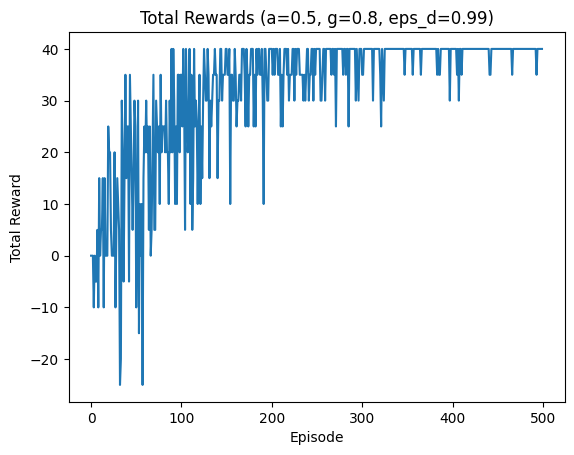

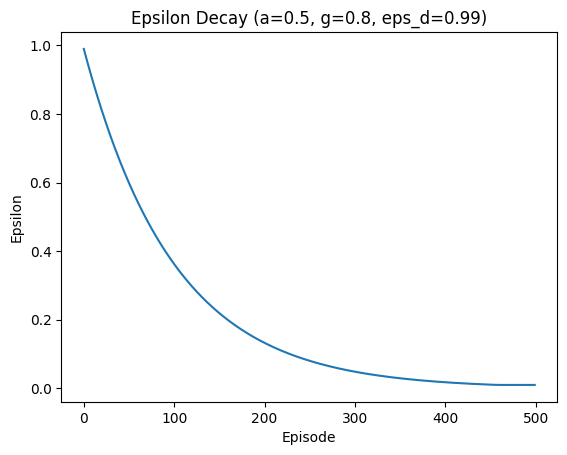

Initial Q1 Table: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
Initial Q2 Table: [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
Trained Q1 Table: [[ 9.9570216  12.79005475 16.         12.38967439]
 [12.05566274 15.91361189 20.         12.37255974]
 [15.86017812 19.99607762 25.         15.97829055]
 [19.99999529 25.         24.9999999  19.99999988]
 [-4.6875     12.62931533  0.9150144  -0.24      ]
 [ 0.          6.96343978 15.53701192  5.42916565]
 [ 1.         19.9998657  10.71420197  8.8641583 ]
 [11.8125     24.9999989  16.93890376 10.7910106 ]
 [ 0.          2.83029209  0.         -3.75      ]
 [-7.

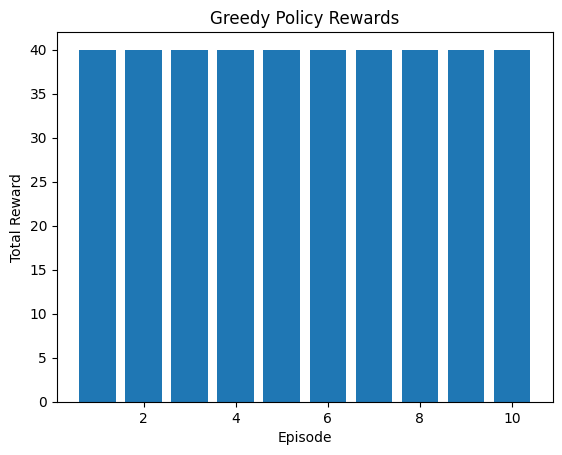

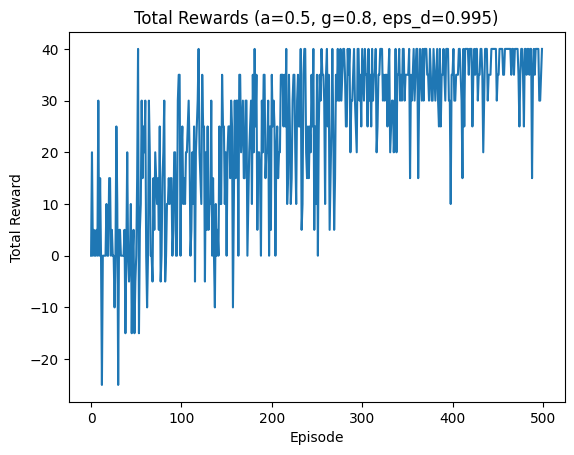

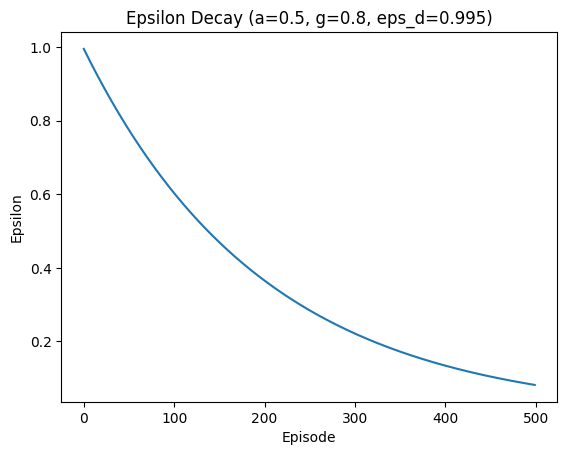

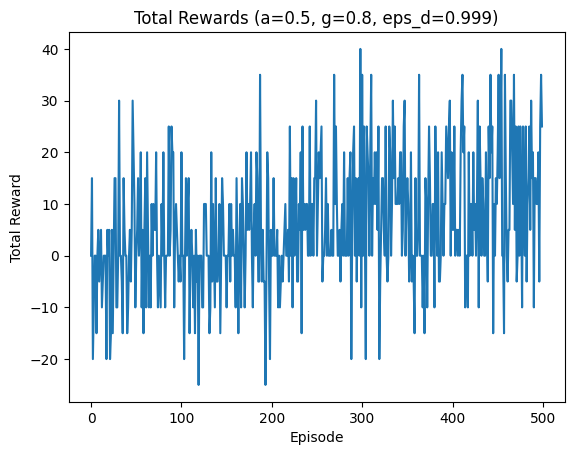

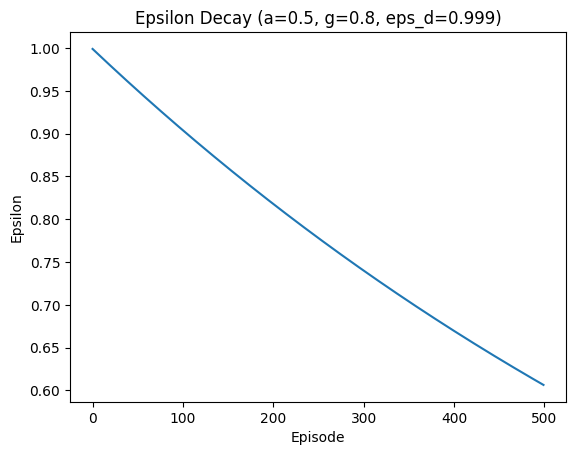

...

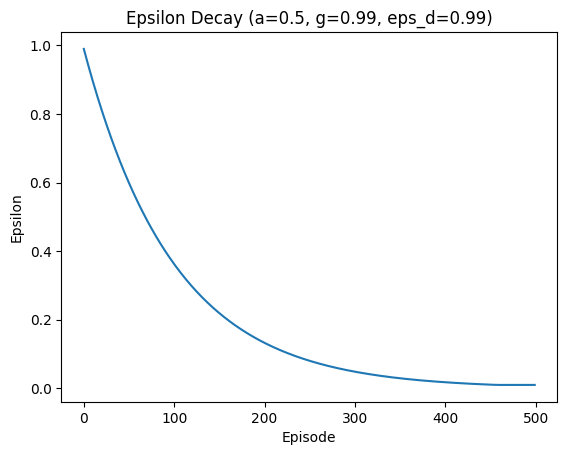

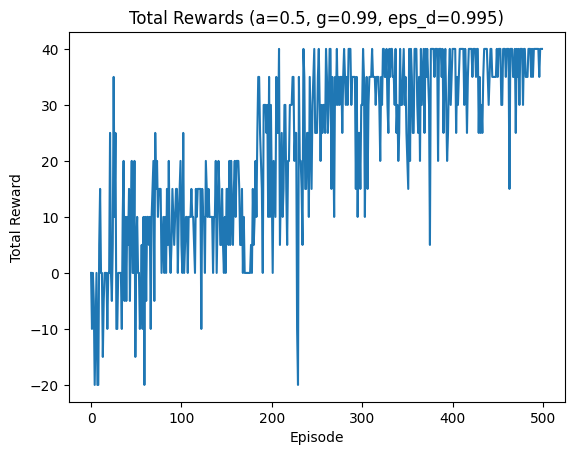

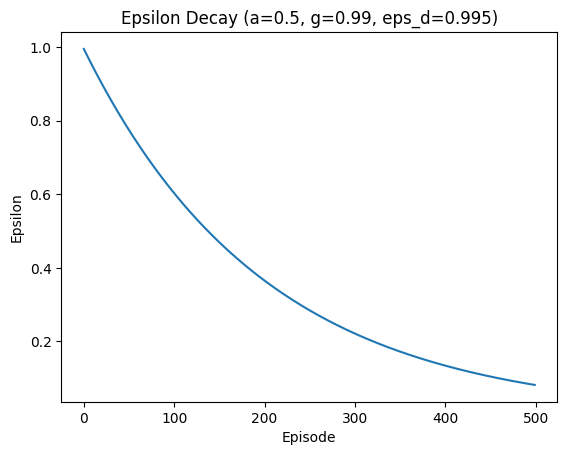

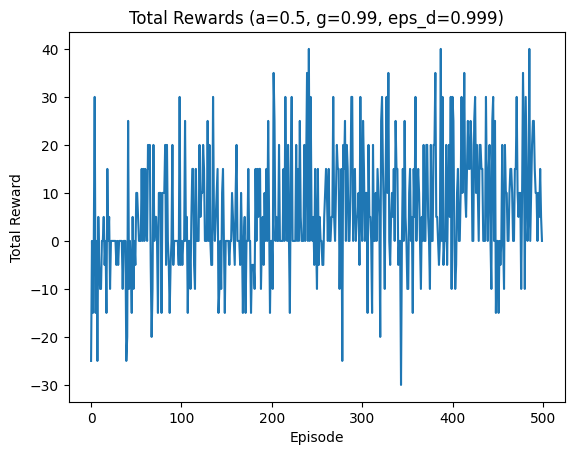

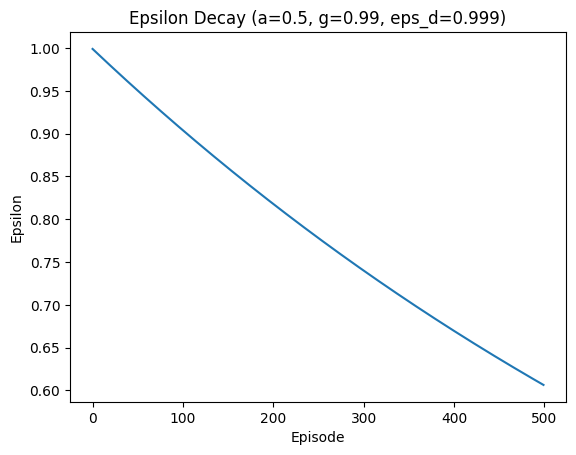

In [ ]:
# Import necessary libraries: numpy for numerical operations, matplotlib.pyplot for plotting,
# random for random number generation, tqdm for progress bars, and itertools.product for Cartesian product.
import numpy as np
import matplotlib.pyplot as plt
import random
from tqdm import tqdm
from itertools import product

# Define a function 'ch_act' for choosing an action based on the current state, action-value functions Q1 and Q2,
# exploration rate epsilon, and the environment.
# It either explores randomly or exploits by choosing the best action based on Q1 and Q2 values.
def ch_act(s,Q1,Q2,eps,env):
    if random.uniform(0,1)<eps:
        return env.act_space.sample()  # Random exploration
    else:
        return np.argmax(Q1[s]+Q2[s])  # Exploitation: choose best action

# Define the function 'dbl_ql' for Double Q-learning algorithm.
# It takes the environment, learning rate, discount factor, decay rate and minimum value for epsilon, and number of episodes.
def dbl_ql(env,a,g,eps_d,eps_min,n_eps):
    n_s=env.os.n  # Number of states
    n_a=env.act_space.n  # Number of actions
    Q1,Q2=np.zeros((n_s,n_a)),np.zeros((n_s,n_a))  # Initialize Q1 and Q2 tables
    r_ep,eps_vals=[],[]  # Lists to store total rewards per episode and epsilon values
    eps=1.0  # Initial exploration rate

    # Loop over episodes
    for ep in tqdm(range(n_eps)):
        s,t_r,dn=env.rst(),0,False  # Reset environment, total reward, and done flag
        while not dn:  # Loop until episode is done
            ac=ch_act(s,Q1,Q2,eps,env)  # Choose action
            ns,r,dn,_=env.stp(ac)  # Take action and observe new state, reward, and whether it's done
            t_r+=r  # Update total reward

            # Update rule: randomly update either Q1 or Q2
            if random.uniform(0,1)<0.5:
                bna=np.argmax(Q1[ns])  # Best next action according to Q1
                tdt=r+g*Q2[ns][bna]  # Target for Q1 update
                Q1[s][ac]+=a*(tdt-Q1[s][ac])  # Update Q1
            else:
                bna=np.argmax(Q2[ns])  # Best next action according to Q2
                tdt=r+g*Q1[ns][bna]  # Target for Q2 update
                Q2[s][ac]+=a*(tdt-Q2[s][ac])  # Update Q2

            s=ns  # Move to next state

        # Decay epsilon and store values
        eps=max(eps_min,eps*eps_d)
        eps_vals.append(eps)
        r_ep.append(t_r)

    return Q1,Q2,r_ep,eps_vals

# Hyperparameters for learning
a_vals=[0.5]  # Learning rates
g_vals=[0.8,0.9,0.99]  # Discount factors
eps_d_vals=[0.99,0.995,0.999]  # Epsilon decay rates
eps_min,n_eps=0.01,500  # Minimum epsilon and number of episodes
env=LGW()  # Initialize environment (LGW object)
res=[]  # List to store results

best_hyperparams=None  # Store best hyperparameters
best_performance=-np.inf  # Initialize best performance

# Grid search over hyperparameters
for a,g,eps_d in product(a_vals,g_vals,eps_d_vals):
    print("Training with a: {}, g: {}, eps_d: {}".format(a,g,eps_d))
    Q1,Q2,r,eps_vals=dbl_ql(env,a,g,eps_d,eps_min,n_eps)  # Run Double Q-learning
    performance=sum(r)  # Calculate performance
    res.append({'a': a, 'g': g, 'eps_d': eps_d, 'Q1': Q1, 'Q2': Q2, 'r': r, 'eps_vals': eps_vals, 'performance': performance})

    # Update best hyperparameters if current performance is better
    if performance>best_performance:
        best_performance=performance
        best_hyperparam={'a': a, 'g': g, 'eps_d': eps_d}

print("Best Hyperparameters:",best_hyperparams)

# Plotting results
for rs in res:
    plt.plot(rs['r'])
    plt.title(f"Total Rewards (a={rs['a']}, g={rs['g']}, eps_d={rs['eps_d']})")
    plt.xlabel('Episode')
    plt.ylabel('Total Reward')
    plt.show()

    plt.plot(rs['eps_vals'])
    plt.title(f"Epsilon Decay (a={rs['a']}, g={rs['g']}, eps_d={rs['eps_d']})")
    plt.xlabel('Episode')
    plt.ylabel('Epsilon')
    plt.show()

    # Evaluating the greedy policy for one set of hyperparameters
    if rs==res[0]:
        print("Initial Q1 Table:",np.zeros((env.os.n, env.act_space.n)))
        print("Initial Q2 Table:",np.zeros((env.os.n, env.act_space.n)))
        print("Trained Q1 Table:",rs['Q1'])
        print("Trained Q2 Table:",rs['Q2'])

        gr_r=[]  # List for greedy policy rewards
        for _ in range(10):
            s,t_r,dn=env.rst(),0,False
            while not dn:
                ac=np.argmax(rs['Q1'][s]+rs['Q2'][s])  # Choose best action from Q1 and Q2
                ns,r,dn,_=env.stp(ac)
                t_r+=r
                s=ns
            gr_r.append(t_r)

        plt.bar(range(1, 11),gr_r)
        plt.title("Greedy Policy Rewards")
        plt.xlabel('Episode')
        plt.ylabel('Total Reward')
        plt.show()

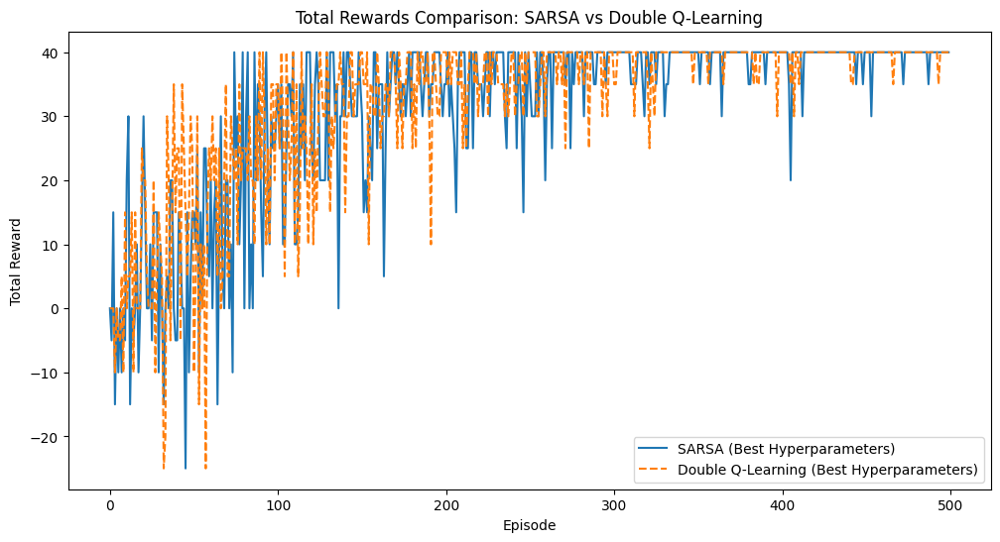

In [ ]:
import matplotlib.pyplot as plt
# Extracting rewards for the best hyperparameters from SARSA code
rewards_sarsa=br['r']
# Finding the corresponding rewards for the best hyperparameters from Double Q Learning code
rewards_double_ql=next(item for item in res if item['a'] == best_hyperparams['a'] and item['g'] == best_hyperparams['g'] and item['eps_d'] == best_hyperparams['eps_d'])['r']
# Plotting both rewards on the same graph
plt.figure(figsize=(12,6))
plt.plot(rewards_sarsa,label='SARSA (Best Hyperparameters)')
plt.plot(rewards_double_ql,label='Double Q-Learning (Best Hyperparameters)',linestyle='--')
plt.title('Total Rewards Comparison: SARSA vs Double Q-Learning')
plt.xlabel('Episode')
plt.ylabel('Total Reward')
plt.legend()
plt.show()

In [ ]:
def n_step_ssa(env, ep, al, ga, e, me, ed, n=2):
    # I initialize the Q-table for the state-action pairs using the state and action spaces from the environment.
    Q=init_qt(env.os, env.act_space)

    # These lists will store the total rewards per episode (rep) and the exploration rates (ev).
    rep=[]
    ev=[]

    # I iterate over the number of episodes specified by 'ep'.
    for i in range(ep):
        # Reset the environment to a starting state and select an initial action using an epsilon-greedy policy.
        st=env.rst()
        ac=egp(Q,e,st,env.act_space)
        tr=0  # This will accumulate the total reward for this episode.
        states=[st]  # Keep track of visited states.
        actions=[ac]  # Keep track of actions taken.
        rewards=[0]  # Start with zero reward.

        # Loop for each step in the episode, limited by the maximum steps in 'env'.
        for t in range(env.ms):
            # Take a step in the environment.
            ns,r,dn,_=env.stp(ac)
            tr+=r  # Update the total reward.

            # Store the new state and reward.
            states.append(ns)
            rewards.append(r)

            # If the state is terminal, update the Q-table for each state-action pair in the trajectory.
            if dn:
                while len(states)>1:
                    # Update the Q-value for the state-action pair using the sum of discounted rewards.
                    Q[states[0]][actions[0]]+=al*(sum(ga**i*rewards[i] for i in range(len(rewards)))-Q[states[0]][actions[0]])
                    # Remove the oldest state, action, and reward.
                    del states[0]
                    del actions[0]
                    del rewards[0]
                break

            # Select the next action using the epsilon-greedy policy.
            na=egp(Q,e,ns,env.act_space)
            actions.append(na)

            # If the trajectory has reached the specified 'n' steps, update the Q-table.
            if len(states)==n+1:
                # Update using the n-step return formula.
                Q[states[0]][actions[0]]+=al*(sum(ga**i*rewards[i] for i in range(n))+ga**n*Q[states[n]][actions[n]]-Q[states[0]][actions[0]])
                # Remove the oldest state, action, and reward.
                del states[0]
                del actions[0]
                del rewards[0]

            # Update the current state and action.
            st,ac=ns,na

        # Append the total reward for this episode and update the exploration rate.
        rep.append(tr)
        e=max(me,e*ed)
        ev.append(e)

    # Return the Q-table, list of total rewards per episode, and exploration rates.
    return Q,rep,ev

Streaming output truncated to the last 5000 lines.
For Step 2: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 2: Agent at [0, 1], action 1
For Step 3: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 3: Agent at [0, 1], action 1
For Step 4: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 4: Agent at [0, 1], action 1
For Step 5: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 5: Agent at [0, 1], action 1
For Step 6: The Agent is now at [0, 1], the reward is: 0.0
The Current state is: 1
Step 6: Agent at [0, 1], action 2
For Step 7: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 7: Agent at [0, 2], action 1
For Step 8: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 8: Agent at [0, 2], action 1
For Step 9: The Agent is now at [0, 2], the reward is: 0.0
The Current state is: 2
Step 9: Agent at [0, 2], action 1
For Step 10: 

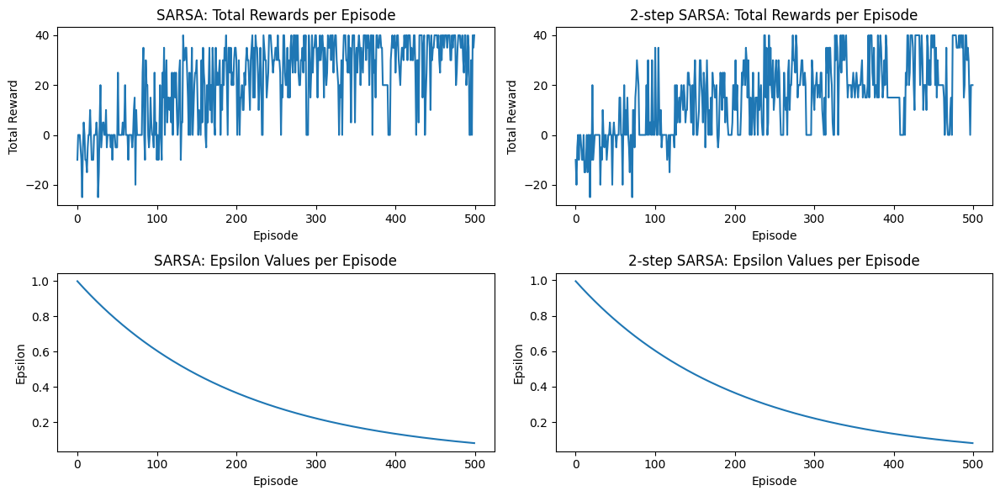

In [ ]:
def compare_algorithms(env,ep,al,ga,e,me,ed,n_steps):
    # First, I run the original SARSA algorithm. I call the 'ssa' function with the provided parameters and store the results.
    # I only store the rewards and epsilon values for each episode since I don't need the final Q-table here.
    _,rewards_sarsa,epsilon_sarsa=ssa(env,ep,al,ga,e,me,ed)

    # Next, I run the n-step SARSA algorithm. This is a variation of SARSA that looks ahead 'n_steps'.
    # Again, I store only the rewards and epsilon values.
    _,rewards_n_step_sarsa,epsilon_n_step_sarsa=n_step_ssa(env,ep,al,ga,e,me,ed,n=n_steps)

    # Now I prepare to plot the results of both algorithms for comparison.
    plt.figure(figsize=(12,6))

    # The first subplot will show the total rewards per episode for the original SARSA.
    plt.subplot(2,2,1)
    plt.plot(rewards_sarsa)
    plt.title('SARSA: Total Rewards per Episode')
    plt.xlabel('Episode')
    plt.ylabel('Total Reward')

    # The second subplot shows the total rewards per episode for the n-step SARSA.
    plt.subplot(2,2,2)
    plt.plot(rewards_n_step_sarsa)
    plt.title(f'{n_steps}-step SARSA: Total Rewards per Episode')
    plt.xlabel('Episode')
    plt.ylabel('Total Reward')

    # The third subplot plots the epsilon values for each episode in the original SARSA.
    # This shows how the exploration factor (epsilon) decreases over time.
    plt.subplot(2,2,3)
    plt.plot(epsilon_sarsa)
    plt.title('SARSA: Epsilon Values per Episode')
    plt.xlabel('Episode')
    plt.ylabel('Epsilon')

    # The fourth subplot does the same for the n-step SARSA.
    plt.subplot(2,2,4)
    plt.plot(epsilon_n_step_sarsa)
    plt.title(f'{n_steps}-step SARSA: Epsilon Values per Episode')
    plt.xlabel('Episode')
    plt.ylabel('Epsilon')

    # I ensure the layout of the plots is tight and then display them.
    plt.tight_layout()
    plt.show()

# Here are the parameters for the comparison.
env=LGW()  # Environment instance.
ep=500  # Total number of episodes to run for each algorithm.
al=0.5  # Learning rate, determines how much new information affects learned values.
ga=0.99  # Discount factor, it discounts future rewards versus immediate rewards.
e=1.0  # Initial value of epsilon, for epsilon-greedy strategy.
me=0.01  # Minimum value of epsilon, prevents it from reaching 0.
ed=0.995  # Epsilon decay rate, controls how quickly exploration is reduced.
n_steps=2  # Specifies the 'n' for n-step SARSA.

# Finally, I call the function to run the comparison with these parameters.
compare_algorithms(env,ep,al,ga,e,me,ed,n_steps)

Initializing the Environment


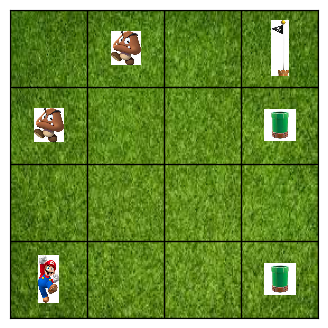

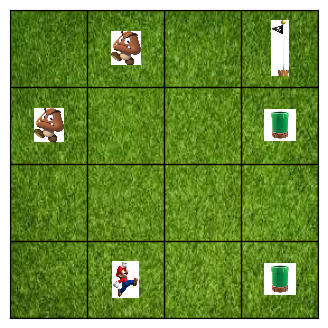

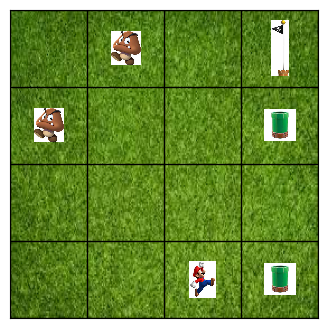

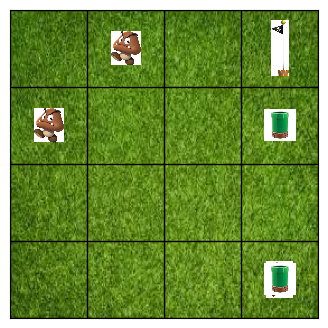

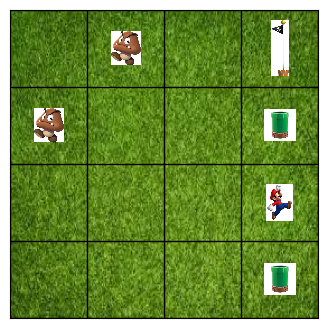

...

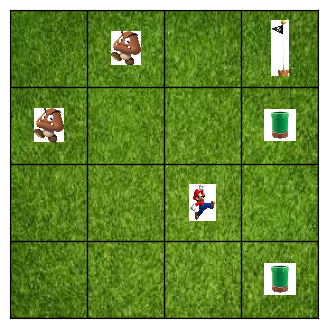

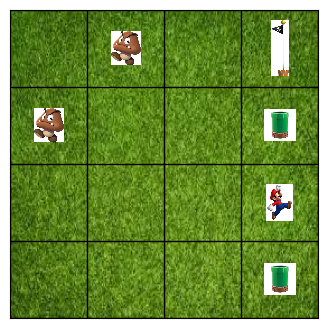

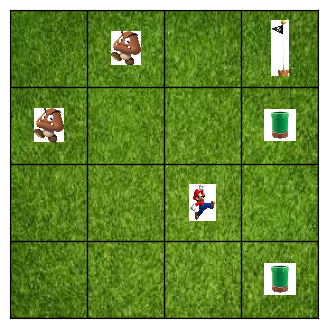

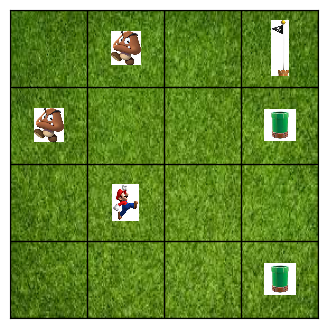

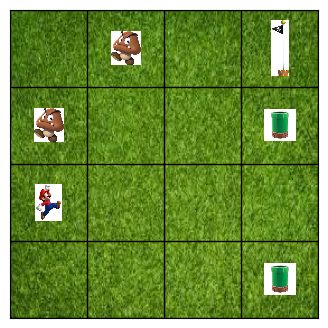

In [3]:
# Importing necessary libraries
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import numpy as np
import gymnasium as gym
from gymnasium import spaces

# Defining a custom environment class inheriting from gym.Env
class LG(gym.Env):
    # Metadata for the environment - here it specifies the render modes available
    md={'render.modes':['human']}

    def __init__(self):
        # Initializer for the environment
        print("Initializing the Environment")  # Printing a message to indicate the environment is initializing
        # Setting the grid size for our environment
        self.sz=4
        # Setting the maximum number of steps per episode
        self.mx_st=10
        # Initializing the current step count
        self.cur_st=0
        # Defining the observation space as a discrete space (i.e., finite number of states)
        self.obs_sp=spaces.Discrete(self.sz**2)
        # Defining the action space as a discrete space with 4 possible actions
        self.act_sp=spaces.Discrete(4)
        # Initializing the agent's starting position
        self.ap=[0,0]
        # Setting the goal position in the grid
        self.gp=[3,3]
        # Specifying positions in the grid that give a positive reward
        self.prp=[(0,3),(2,3)]
        # Specifying positions in the grid that give a negative reward
        self.nrp=[(2,0),(3,1)]
        # Initializing a grid to hold reward values, with zeros initially
        self.rw=np.zeros((self.sz,self.sz))
        # Assigning reward values to the positions specified in prp and nrp
        for p in self.prp:
            self.rw[p]=5 if p!=self.gp else 10
        for p in self.nrp:
            self.rw[p]=-5 if p!=self.gp else 10
        # A flag to track whether the agent is moving
        self.mvg=False

    def reset(self):
        # Method to reset the environment to its initial state
        self.ap=[0,0]  # Resetting agent's position
        self.cur_st=0   # Resetting the step counter
        self.mvg=False  # Resetting the movement flag
        return self._get_state()  # Returning the initial state

    def step(self,act):
        # Method to take a step in the environment given an action
        # Saving the old position to check if the agent moves
        op=self.ap.copy()
        # Movement logic: updating the agent's position based on the action
        if act==0 and self.ap[0]<self.sz-1:
            self.ap[0]+=1
        elif act==1 and self.ap[0]>0:
            self.ap[0]-=1
        elif act==2 and self.ap[1]<self.sz-1:
            self.ap[1]+=1
        elif act==3 and self.ap[1]>0:
            self.ap[1]-=1

        # Clipping the agent's position to ensure it remains within grid boundaries
        self.ap=np.clip(self.ap,0,self.sz-1).tolist()
        # Incrementing the step counter
        self.cur_st+=1
        # Updating the movement flag
        self.mvg=op !=self.ap

        # Initializing reward and done flag
        dn=False
        rw=0
        # Checking if the agent has reached the goal position
        if self.ap==self.gp:
            rw=10  # Assigning reward for reaching the goal
            dn=True  # Indicating the episode is finished
        else:
            # Assigning reward based on the current position
            rw=self.rw[self.ap[0],self.ap[1]]
            # Checking if maximum steps are reached
            dn=self.cur_st>=self.mx_st

        # Getting the current state
        st=self._get_state()
        return st,rw,dn,{}  # Returning the state, reward, done flag, and info

    def render(self,mode='human'):
        # Method for rendering the environment's state
        fig,ax=plt.subplots(figsize=(self.sz,self.sz))  # Creating a figure and axes
        # Setting up the grid visualization
        ax.set_xlim(-0.5,self.sz-0.5)
        ax.set_ylim(-0.5,self.sz-0.5)
        ax.set_xticks(np.arange(-0.5,self.sz,1))
        ax.set_yticks(np.arange(-0.5,self.sz,1))
        ax.grid(which='major',color='black',linestyle='-',linewidth=1)
        ax.tick_params(size=0,labelbottom=False,labelleft=False)
        ax.invert_yaxis()

        # Loading and displaying the background image
        bg_img=plt.imread('download.jpeg')
        ax.imshow(bg_img,extent=[-0.5,self.sz-0.5,-0.5,self.sz-0.5])

        # Choosing and displaying the agent image based on movement
        ag_img_pth='agent_moving.jpeg' if self.mvg else 'agent_reward.jpeg'
        ag_img=plt.imread(ag_img_pth)
        ag_icon=AnnotationBbox(OffsetImage(ag_img,zoom=0.1),
                                 (self.ap[1],self.sz-1-self.ap[0]),frameon=False)
        ax.add_artist(ag_icon)

        # Looping through positive reward positions to display them
        for p in self.prp:
            rp_img=plt.imread('green pipe.jpeg')
            rp_icon=AnnotationBbox(OffsetImage(rp_img,zoom=0.1),
                                     (p[1],self.sz-1-p[0]),frameon=False)
            ax.add_artist(rp_icon)

        # Looping through negative reward positions to display them
        for p in self.nrp:
            ob_img=plt.imread('enemy.jpeg')
            ob_icon=AnnotationBbox(OffsetImage(ob_img,zoom=0.1),
                                     (p[1],self.sz-1-p[0]),frameon=False)
            ax.add_artist(ob_icon)

        # Displaying the goal position
        gl_img=plt.imread('pole.jpeg')
        gl_icon=AnnotationBbox(OffsetImage(gl_img,zoom=0.1),
                                 (self.gp[1],self.sz-1-self.gp[0]),frameon=False)
        ax.add_artist(gl_icon)

        plt.show()  # Showing the figure

    def _get_state(self):
        # Private method to get the current state of the environment
        return self.sz*self.ap[0]+self.ap[1]  # Returning the state as a single number

# Creating an instance of the LG environment
env=LG()
st=env.reset()  # Resetting the environment and getting the initial state
env.render()  # Rendering the initial state
dn=False  # Flag to keep track of whether the episode is finished

# Loop to run the environment until the episode ends
while not dn:
    act=env.act_sp.sample()  # Sampling an action randomly
    ns,rw,dn,_=env.step(act)  # Taking a step in the environment
    env.render()  # Rendering the new state